# Lunar Cycle Influence on Twitter Sentiment and Stock Markets

### Abstract

This project investigates whether there is any correlation between lunar phases and human behavioral trends, as seen through sentiment analysis of Tweets and time series analysis of stock prices and currency exchange rates. This project was inspired by the contentious academic claims regarding whether lunar cycles affeect human behavior (see [Thakur and Sharma, 1984](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1444800/) and [Shafer, et al., 2010](https://www.sciencedirect.com/science/article/pii/S0047235210000589?via%3Dihub) for two examples of opposing views; there are many scholars on both sides of this debate). 

For this project, I scraped approximately 1,000 tweets per day for every day of 2018 using a variety of keyword search phrases. This process resulted in a dataset of over 365,000 tweets per search phrase. The resulting datasets were then processed for sentiment and aggregated by date to examine sentiment trends over time. Additionally, daily financial data for 2018 for a variety of stocks, currencies, and market indices were scraped from the internet.

Both Twitter and financial data were then modeled using Facebook Prophet to determine the degree (or absence) of any seasonality correlated to the visible phases of the moon. 

#### Dashboard of Results

If you wish to explore my findings for yourself, feel free to head over to an interactive dashboard called [human-lunar-cycles](https://human-lunar-cycles.herokuapp.com/).

## Import Libraries

In [2]:
# basic use libraries
import re
import numpy as np
import datetime
import pandas as pd

# for scraping the web
from bs4 import BeautifulSoup
import requests
from twitterscraper import query_tweets
import twitterscraper

# for visualizations
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
from wordcloud import WordCloud

# file management
import csv
import json
import subprocess
import shutil

#for initial time-series modeling
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose as sd

# Facebook Prophet libraries
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_cross_validation_metric
from fbprophet.diagnostics import cross_validation, performance_metrics
import plotly.offline as py
pd.plotting.register_matplotlib_converters() #necessary to maintain pd.plotting functionality

# for NLP
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
from textblob import TextBlob 
# import preprocessor as p   #is this the right one?    I want this one: https://pypi.org/project/tweet-preprocessor/

INFO: {'User-Agent': 'Mozilla/5.0 (Windows; U; Windows NT 6.1; x64; fr; rv:1.9.2.13) Gecko/20101203 Firebird/3.6.13'}


# 1. Obtaining the Data

We will use the `twitterscraper` library for obtaining tweets. This will be done with the library's cmd line method. Documentation here: https://github.com/taspinar/twitterscraper

In [3]:
# define functions to automate Twitter scraping
def make_dates_list(year=2018):
    """Makes two list of dates for a given year, 
    one with and one without dashes."""
    # define a list of dates for a given year
    dates_year =[str(date)[:10] for date in pd.date_range(start=f'1/1/{year}', end=f'12/31/{year}')]
    # define a list of dates for generating file names
    dates_stripped_year = [date.replace('-','') for date in dates_year]
    return dates_year, dates_stripped_year


def scrape_tweets(query, year=2018, num_tweets=1000):
    """
    Automatically scrapes X number of Tweets per day for a
    given year. Scraping works backwards from midnight.
    'query' must be a string
    ------------------------------------
    Generates a JSON file for each day scraped, and moves 
    to the subfolder 'data'.
    """
    dates_year, dates_stripped_year = make_dates_list(year)
    for i in range(len(dates_year)):
        begin_date = dates_year[i]
        if i == len(dates_year)-1:
            end_date = f'{year+1}-01-01'
        else:
            end_date = dates_year[i+1]
        day = dates_stripped_year[i]
        cmd = 'twitterscraper "{}" -l {} -o t{}.json -bd {} -ed {} --lang en'.format(query, 
                num_tweets, day, begin_date, end_date)
        subprocess.run(cmd)

        #move JSON file into `data` directory
        shutil.move(f't{day}.json', f'./data/t{day}.json')
        if (i+1)%5 == 0:
            print(f"finished scraping {i+1} days of {year}")
    print("SCRAPING PROCESS COMPLETE!")
    pass

#### The block below has been commented out to prevent auto-running a process that can take hours.

In [4]:
break #comment out this line if you want to execute, WARNING: takes hours

# Define your Twitter query and then execute
query = 'life OR death OR happy OR sad Exclude:retweets'
scrape_tweets(query=query, year=2018, num_tweets=1000)

SyntaxError: 'break' outside loop (<ipython-input-4-9eeb36354d0f>, line 1)

## Obtaining (and cleaning) Financial Data

We will be using the following website to get historical infra-day stock prices: https://www.alphavantage.co/documentation/
   * request limitations: 5/minute, 500/day
   * URL structure: https://www.alphavantage.co/query?function=TIME_SERIES_DAILY&symbol=MSFT&outputsize=full&apikey=demo
 
Since stock markets are only open 6.5 hours a day, 5 days a week, certain lunar cycle days will fall on weekends, while considerable after-hours trading can affect next-day opening prices. Since lunar cycles are most noticeble at night, we shall set stock days as 24-hour periods, from opening bell to following opening bell to account for evening trading. 

In [5]:
# Define functions to scrape and clean financial data for a given year
def fetch_data(symbol, object_type, stocks_apikey):
    # Making an API request for a certain stock's history
    if object_type == 'currency':
        credentials = {'function':'FX_DAILY', 
                       'from_symbol':symbol, 
                       'to_symbol':'USD', 
                       'outputsize':'full',
                       'apikey':stocks_API_key}
    elif object_type == 'cryptocurrency':
        credentials = {'function':'DIGITAL_CURRENCY_DAILY', 
                       'symbol':symbol, 
                       'market':'USD', 
                       'apikey':stocks_API_key}
    else:
        credentials = {'function':'TIME_SERIES_DAILY',
                       'symbol':symbol,
                       'outputsize':'full',
                       'apikey':stocks_apikey}

    r = requests.get('https://www.alphavantage.co/query', params=credentials)
    # checking to make sure request was successful
    print(r.status_code)
    if r.status_code == requests.codes.ok:
        print("Request Successful")
    return r


def clean_financials(r, object_type):
    # cleaning up the data to make it easier to work with
    if object_type == 'currency':
        df = pd.DataFrame(r.json()["Time Series FX (Daily)"])
    elif object_type == 'cryptocurrency':
        df = pd.DataFrame(r.json()["Time Series (Digital Currency Daily)"])
    elif object_type in ['stock','index']:
        df = pd.DataFrame(r.json()["Time Series (Daily)"])

    df = df.T.reset_index()

    if object_type == 'cryptocurrency':
        df.drop(columns=["1b. open (USD)","2b. high (USD)","3b. low (USD)",
            "4b. close (USD)","6. market cap (USD)"], inplace=True, axis=1)

    if object_type == 'currency':
        df.columns = ['date','open','high','low','close']
        df.date = pd.to_datetime(df.date)
        df[['open','high','low','close']] = df[['open',
            'high','low','close']].astype(float)
    else:
        df.columns = ['date','open','high','low','close','volume']
        df.date = pd.to_datetime(df.date)
        df[['open','high','low','close','volume']] = df[['open',
            'high','low','close','volume']].astype(float)

    # create a new column to account for after-hours trading
    # this uses the next day's open value as the prior day's close value
    cl24 = [df.loc[0].close]
    for val in df.open.values:
        cl24.append(val)
    cl24 = pd.DataFrame(cl24[:-1], columns=['close_24'])
    df = df.join(cl24)

    # now we must account for when afterhours trading exceeds high/low values
    df['high_24'] = df[['high', 'close_24']].values.max(1)
    df['low_24'] = df[['low', 'close_24']].values.min(1)
    # and add a few more columns that should be useful
    df['range'] = df['high'] - df['low']
    df['range_24'] = df['high_24'] - df['low_24']
    df['change_24'] = df['close_24'] - df['open']
    # setting date column as index to facilitate timeseries manipulation
    df.set_index('date', inplace=True)
    return df


def plot_financial_data(df, symbol="TICKER_Symbol", column='close_24', year=2018):
    "Plots financial data from a DataFrame"
    plt.figure(figsize=(15,5))
    plt.plot(df[column], label=column)
    plt.title(f"{symbol} Daily Performance for {year}", fontsize=16)
    plt.ylabel("Price (in USD)", fontsize=14)
    plt.legend(loc='best', borderpad=1, fontsize=14);
    pass


def get_financial_data(symbol, object_type, stocks_apikey, column="close_24", year=2018, verbose=True):
    """
    Inputs:
    symbol         (string) Stock or Currency symbol
    object_type    (string) must be one of these:
                      'stock'
                      'index'
                      'currency'
                      'cryptocurrency'
    stocks_apikey  (string) your API key for 
                      https://www.alphavantage.co
    year           (int) the year you wish to examine
    verbose        if True, displays .info() and .head() of data
    =========================================
    Returns a DataFrame of daily financial information containing
    at least opening, closing, high, and low values.
    """
    valid_types = ['stock','index','currency','cryptocurrency']
    if object_type in valid_types:
        r = fetch_data(symbol, object_type, stocks_apikey)
        df = clean_financials(r, object_type)    #cleaning data
        year_df = df[f'{year}':f'{year}']        # getting 1 year's data
        if verbose:
            display(year_df.head(),year_df.info())
        plot_financial_data(df=year_df, symbol=symbol, column=column, year=year)
        return year_df
    else:
        print("""
        Invalid entry for 'object_type', must be one of these strings:
                'stock'
                'index'
                'currency'
                'cryptocurrency'
        """)
        pass

### Let's look at a few stocks and currencies

In [1]:
# Insert your API key for https://www.alphavantage.co/documentation/ below
stocks_API_key = ''

200
Request Successful
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 251 entries, 2018-12-31 to 2018-01-02
Data columns (total 11 columns):
open         251 non-null float64
high         251 non-null float64
low          251 non-null float64
close        251 non-null float64
volume       251 non-null float64
close_24     251 non-null float64
high_24      251 non-null float64
low_24       251 non-null float64
range        251 non-null float64
range_24     251 non-null float64
change_24    251 non-null float64
dtypes: float64(11)
memory usage: 23.5 KB


,open,high,low,close,volume,close_24,high_24,low_24,range,range_24,change_24
date,,,,,,,,,,,
2018-12-31,101.2871,102.40,100.44,101.57,33173800.0,99.5500,102.40,99.55,1.96,2.85,-1.7371
2018-12-28,102.0900,102.41,99.52,100.39,38196300.0,101.2871,102.41,99.52,2.89,2.89,-0.8029
2018-12-27,99.3000,101.19,96.40,101.18,49498500.0,102.0900,102.09,96.40,4.79,5.69,2.7900
2018-12-26,95.1400,100.69,93.96,100.56,51634800.0,99.3000,100.69,93.96,6.73,6.73,4.1600
2018-12-24,97.6800,97.97,93.98,94.13,43935200.0,95.1400,97.97,93.98,3.99,3.99,-2.5400


None

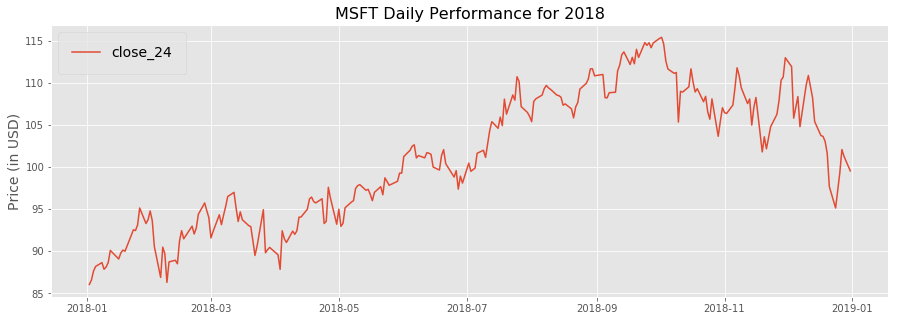

In [6]:
# Microsoft
MSFT_2018 = get_financial_data('MSFT', 
                               'stock', 
                               stocks_API_key, 
                               column="close_24", 
                               year=2018)

200
Request Successful
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 251 entries, 2018-12-31 to 2018-01-02
Data columns (total 11 columns):
open         251 non-null float64
high         251 non-null float64
low          251 non-null float64
close        251 non-null float64
volume       251 non-null float64
close_24     251 non-null float64
high_24      251 non-null float64
low_24       251 non-null float64
range        251 non-null float64
range_24     251 non-null float64
change_24    251 non-null float64
dtypes: float64(11)
memory usage: 23.5 KB


,open,high,low,close,volume,close_24,high_24,low_24,range,range_24,change_24
date,,,,,,,,,,,
2018-12-31,2498.9399,2509.2400,2482.8201,2506.8501,3.442870e+09,2476.9600,2509.2400,2476.9600,26.4199,32.2800,-21.9799
2018-12-28,2498.7700,2520.2700,2472.8899,2485.7400,3.702620e+09,2498.9399,2520.2700,2472.8899,47.3801,47.3801,0.1699
2018-12-27,2442.5000,2489.1001,2397.9399,2488.8301,4.096610e+09,2498.7700,2498.7700,2397.9399,91.1602,100.8301,56.2700
2018-12-26,2363.1201,2467.7600,2346.5801,2467.7000,4.233990e+09,2442.5000,2467.7600,2346.5801,121.1799,121.1799,79.3799
2018-12-24,2400.5601,2410.3401,2351.1001,2351.1001,2.613930e+09,2363.1201,2410.3401,2351.1001,59.2400,59.2400,-37.4400


None

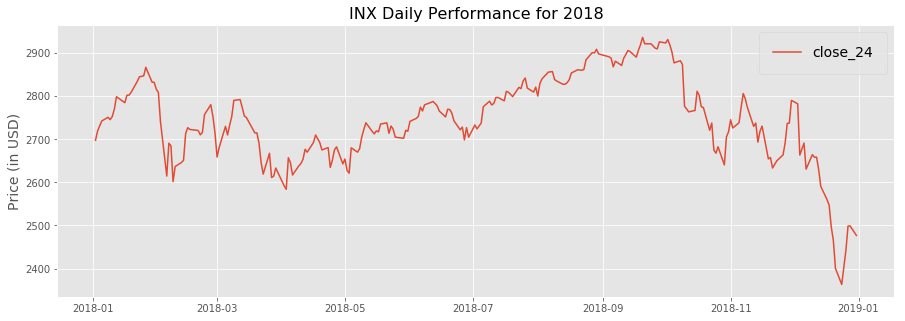

In [7]:
# S&P 500 (stock market index)
# The S&P 500 is an average of the performance of 
# 500 large companies, so we can use this to approximate 
# the entire stock market. (It is one of the most commonly 
# used indicators of the overall US stock market).
SP500_2018 = get_financial_data('INX', 
                                'stock', 
                                stocks_API_key, 
                                column="close_24", 
                                year=2018)

200
Request Successful
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 314 entries, 2018-12-31 to 2018-01-01
Data columns (total 10 columns):
open         314 non-null float64
high         314 non-null float64
low          314 non-null float64
close        314 non-null float64
close_24     314 non-null float64
high_24      314 non-null float64
low_24       314 non-null float64
range        314 non-null float64
range_24     314 non-null float64
change_24    314 non-null float64
dtypes: float64(10)
memory usage: 27.0 KB


,open,high,low,close,close_24,high_24,low_24,range,range_24,change_24
date,,,,,,,,,,
2018-12-31,1.1439,1.1467,1.1420,1.1466,1.1465,1.1467,1.1420,0.0047,0.0047,0.0026
2018-12-30,1.1445,1.1450,1.1433,1.1439,1.1439,1.1450,1.1433,0.0017,0.0017,-0.0006
2018-12-28,1.1429,1.1473,1.1426,1.1442,1.1445,1.1473,1.1426,0.0047,0.0047,0.0016
2018-12-27,1.1355,1.1454,1.1354,1.1429,1.1429,1.1454,1.1354,0.0100,0.0100,0.0074
2018-12-26,1.1411,1.1420,1.1341,1.1355,1.1355,1.1420,1.1341,0.0079,0.0079,-0.0056


None

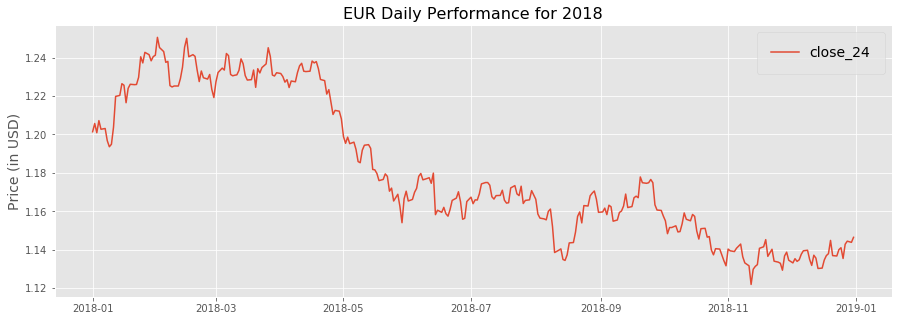

In [8]:
# Euro - USD exchange market
EUR_2018 = get_financial_data('EUR', 
                              'currency', 
                              stocks_API_key, 
                              column="close_24", 
                              year=2018)

200
Request Successful
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 365 entries, 2018-12-31 to 2018-01-01
Data columns (total 11 columns):
open         365 non-null float64
high         365 non-null float64
low          365 non-null float64
close        365 non-null float64
volume       365 non-null float64
close_24     365 non-null float64
high_24      365 non-null float64
low_24       365 non-null float64
range        365 non-null float64
range_24     365 non-null float64
change_24    365 non-null float64
dtypes: float64(11)
memory usage: 34.2 KB


,open,high,low,close,volume,close_24,high_24,low_24,range,range_24,change_24
date,,,,,,,,,,,
2018-12-31,3803.12,3810.00,3630.33,3702.90,29991.778350,3701.23,3810.00,3630.33,179.67,179.67,-101.89
2018-12-30,3696.71,3903.50,3657.90,3801.91,33222.369262,3803.12,3903.50,3657.90,245.60,245.60,106.41
2018-12-29,3839.00,3892.00,3670.00,3695.32,38874.373903,3696.71,3892.00,3670.00,222.00,222.00,-142.29
2018-12-28,3567.89,3887.25,3540.04,3839.26,45964.304987,3839.00,3887.25,3540.04,347.21,347.21,271.11
2018-12-27,3777.74,3813.98,3535.00,3567.91,44097.392912,3567.89,3813.98,3535.00,278.98,278.98,-209.85


None

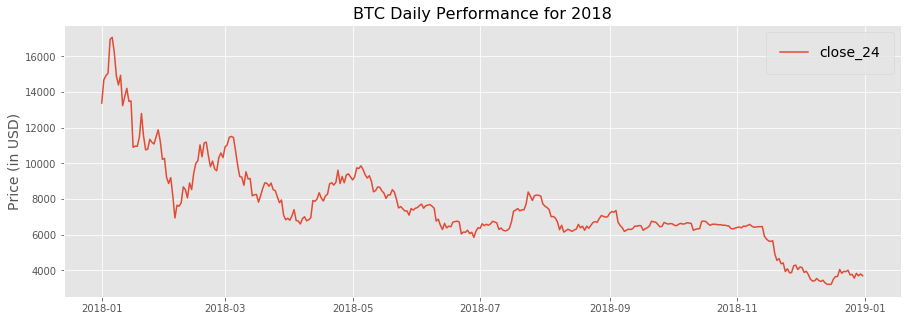

In [9]:
# Bitcoin - USD exchange market
BTC_2018 = get_financial_data('BTC', 
                              'cryptocurrency', 
                              stocks_API_key, 
                              column="close_24", 
                              year=2018)

200
Request Successful
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 251 entries, 2018-12-31 to 2018-01-02
Data columns (total 11 columns):
open         251 non-null float64
high         251 non-null float64
low          251 non-null float64
close        251 non-null float64
volume       251 non-null float64
close_24     251 non-null float64
high_24      251 non-null float64
low_24       251 non-null float64
range        251 non-null float64
range_24     251 non-null float64
change_24    251 non-null float64
dtypes: float64(11)
memory usage: 23.5 KB


,open,high,low,close,volume,close_24,high_24,low_24,range,range_24,change_24
date,,,,,,,,,,,
2018-12-31,163.00,163.52,160.24,161.89,814900.0,160.10,163.52,160.10,3.28,3.42,-2.90
2018-12-28,164.54,165.06,161.52,162.49,575700.0,163.00,165.06,161.52,3.54,3.54,-1.54
2018-12-27,162.65,164.99,158.04,163.19,687800.0,164.54,164.99,158.04,6.95,6.95,1.89
2018-12-26,158.00,164.28,155.19,164.27,1044500.0,162.65,164.28,155.19,9.09,9.09,4.65
2018-12-24,161.17,162.88,157.90,158.13,830500.0,158.00,162.88,157.90,4.98,4.98,-3.17


None

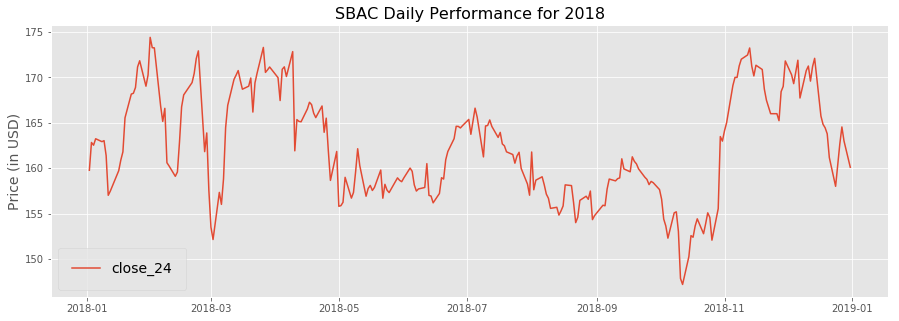

In [45]:
# Finally, let's look at a stock known for its low volatility
SBAC_2018 = get_financial_data(symbol='SBAC', 
                               object_type='stock', 
                               stocks_apikey=stocks_API_key,
                               column="close_24",
                               year=2018, 
                               verbose=True)

# 2. Scrubbing the Data

Thankfully, the stock market data is already completely cleaned. The twitter data, however, still requires pretty extensive scrubbing to remove odd characters, links, and usernames. 

### Processing Tweets

CSVwriter doesn't understand emojis and some other special characters, so we need to remove them.

In [11]:
# Let's define sets of old-school emoticons and emojis
# Happy Emoticons
emoticons_happy = set([
    ':-)', ':)', ';)', ':o)', ':]', ':3', ':c)', ':>', '=]', '8)', '=)', ':}',
    ':^)', ':-D', ':D', '8-D', '8D', 'x-D', 'xD', 'X-D', 'XD', '=-D', '=D',
    '=-3', '=3', ':-))', ":'-)", ":')", ':*', ':^*', '>:P', ':-P', ':P', 'X-P',
    'x-p', 'xp', 'XP', ':-p', ':p', '=p', ':-b', ':b', '>:)', '>;)', '>:-)',
    '<3'
    ])

# Sad Emoticons
emoticons_sad = set([
    ':L', ':-/', '>:/', ':S', '>:[', ':@', ':-(', ':[', ':-||', '=L', ':<',
    ':-[', ':-<', '=\\', '=/', '>:(', ':(', '>.<', ":'-(", ":'(", ':\\', ':-c',
    ':c', ':{', '>:\\', ';('
    ])

#Emoji patterns
emoji_pattern = re.compile("["
         u"\U0001F600-\U0001F64F"  # emoticons
         u"\U0001F300-\U0001F5FF"  # symbols & pictographs
         u"\U0001F680-\U0001F6FF"  # transport & map symbols
         u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
         u"\U00002702-\U000027B0"
         u"\U000024C2-\U0001F251"
         "]+", flags=re.UNICODE)

In [12]:
# Define functions to clean tweets and get tweet sentiment

# portions of the code below comes from :
# https://towardsdatascience.com/extracting-twitter-data-pre-processing-and-sentiment-analysis-using-python-3-0-7192bd8b47cf
def replace_emoticons(tweet):
    "This code replaces happy and sad emoticons with the words 'HAPPY' and 'SAD'"
    rhappy = '[' + re.escape(''.join(emoticons_happy)) + ']'
    re.sub(rhappy, ' HAPPY ', tweet)
    rsad = '[' + re.escape(''.join(emoticons_sad)) + ']'
    re.sub(rsad, ' SAD ', tweet)
    return tweet

def clean_tweet(tweet): 
    ''' 
    Utility function to clean tweet text by removing links, usernames, and
    special characters using simple regex statements. 
    '''
    tweet = replace_emoticons(tweet)
    # p.set_options(p.OPT.URL, p.OPT.EMOJI, p.OPT.MENTION)
    # tweet = p.clean(tweet)
    tweet = ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t]) \
                            |(\w+:\/\/\S+)", " ", tweet).split())
    return tweet

def double_clean_tweet(tweet):
    "This function goes a little further than the previous clean function"
    #removing mentions
    tweet = re.sub(r':', ' ', tweet)
    tweet = re.sub(r'‚Ä¶', ' ', tweet)
    #replace consecutive non-ASCII characters with a space
    tweet = re.sub(r'[^\x00-\x7F]+',' ', tweet)
    #remove emojis from tweet  (unless you want to later go through the UNICODE
    # charts and separate "happy" emojis from "sad" emojis and add them to 
    # the `replace_emoticons()` function)
    tweet = emoji_pattern.sub(r'', tweet)
    return tweet


# Sentiment analysis code below adapted from:
# https://www.geeksforgeeks.org/twitter-sentiment-analysis-using-python/
def get_tweet_sentiment(tweet): 
    ''' 
    Utility function to classify sentiment of passed tweet 
    using textblob's sentiment method 
    '''
    # create TextBlob object of passed tweet text 
    analysis = TextBlob(tweet)
    # set sentiment 
    polarity = analysis.sentiment.polarity
    subjectivity = analysis.sentiment.subjectivity
    if analysis.sentiment.polarity > 0.1: 
        sentiment = 'positive'
    elif analysis.sentiment.polarity < -0.1: 
        sentiment = 'negative'
    else: 
        sentiment = 'neutral'
    return sentiment, polarity, subjectivity

In [13]:
# define a function to create a .CSV file that compiles the relevant 
# info from the JSONs, preprocesses the tweets, and performs sentiment analysis
def json_to_csv_tweets(output_filename='output.csv', year=2018):
    """
    Takes in JSON files of scraped tweets from the `./data/` folder,
    cleans the tweets, performs sentiment analysis, and then outputs
    the results to the provided destination CSV filename.
    """
    # create the csv writer object
    csvwriter = csv.writer(open(output_filename, 'w', newline=''))
    csvwriter.writerow(["timestamp", "text", "sentiment", "polarity", "subjectivity", "tally"])

    # iterate adding rows of JSON to the CSV file
    dates_year, dates_stripped_year = make_dates_list(year)
    for i in dates_stripped_year:
        f = open(f'./data/t{i}.json')
        data = json.load(f)
        for tweet in data:
            tw = tweet["text"]
            tw = replace_emoticons(tw)
            tw = clean_tweet(tw)
            tw = double_clean_tweet(tw)
            sentiment, polarity, subjectivity = get_tweet_sentiment(tw)
            csvwriter.writerow([i, tw, sentiment, polarity, subjectivity, 1])
        f.close()
        if float(i)%20 == 0:
            print(f"Finished working with:   ./data/t{i}.json")
    print("JOB IS COMPLETELY FINISHED.  HOORAY!!")
    pass

#### The block below includes a `break` to prevent automatic execution of code that can take hours to run.

In [142]:
break     ### remove this line to run this code block

json_to_csv_tweets('tweets_happysad_2018.csv', year=2018)

Finished working with:   ./data/t20180120.json
Finished working with:   ./data/t20180220.json
Finished working with:   ./data/t20180320.json
Finished working with:   ./data/t20180420.json
Finished working with:   ./data/t20180520.json
Finished working with:   ./data/t20180620.json
Finished working with:   ./data/t20180720.json
Finished working with:   ./data/t20180820.json
Finished working with:   ./data/t20180920.json
Finished working with:   ./data/t20181020.json
Finished working with:   ./data/t20181120.json
Finished working with:   ./data/t20181220.json
JOB IS COMPLETELY FINISHED.  HOORAY!!


### Now that our data is cleaned, let's explore one of the queries we made.

In [14]:
tw_df = pd.read_csv('tweets_happysad_2018.csv')
tw_df.timestamp = pd.to_datetime(tw_df.timestamp, format='%Y%m%d')

In [15]:
display(tw_df.head())
tw_df.info()

,timestamp,text,sentiment,polarity,subjectivity,tally
0,2018-01-01,Thanks for your insightful commentaryIf only l...,neutral,0.008333,0.408333,1
1,2018-01-01,1st-Mail | HAPPY NEW YEAR!,positive,0.485227,0.727273,1
2,2018-01-01,"Poor and sick?May God be with you,in the futur...",negative,-0.100000,0.241667,1
3,2018-01-01,Happy birthday,positive,0.800000,1.000000,1
4,2018-01-01,Late to the party but HAPPY NEW YEAR to all yo...,positive,0.181061,0.534091,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 370206 entries, 0 to 370205
Data columns (total 6 columns):
timestamp       370206 non-null datetime64[ns]
text            370206 non-null object
sentiment       370206 non-null object
polarity        370206 non-null float64
subjectivity    370206 non-null float64
tally           370206 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(1), object(2)
memory usage: 16.9+ MB


**Before we continue, let's just make sure that our scraping process was at least mostly successful in pulling 1000 tweets per day.**

In [16]:
grouped = pd.DataFrame(tw_df.groupby(['timestamp', 'sentiment'])['tally'].sum()).reset_index()

grouped1 = pd.DataFrame(tw_df.groupby(['timestamp'])['tally'].sum())
grouped1 = grouped1.sort_values(by=['tally'])
grouped1.head()

,tally
timestamp,
2018-01-13,20
2018-02-14,300
2018-04-17,680
2018-06-02,1007
2018-12-21,1017


**According to the table above, it seems that our twitter scraper may have failed to work properly for 3 days of the year. That's not too bad, so we'll ignore it for now.**

# 3. Exploratory Data Analysis (EDA)



In [17]:
# let's plot sentiment trends
def plot_sentiments(csv_filename='tweets.csv', year=2018, positive_only=False):
    tweets_df = pd.read_csv(csv_filename)
    tweets_df.timestamp = pd.to_datetime(tweets_df.timestamp, format='%Y%m%d')
    grouped = pd.DataFrame(tweets_df.groupby(['timestamp', 'sentiment'])['tally'].sum()).reset_index()
    if positive_only:
        temp_df = grouped[grouped.sentiment == 'positive'].set_index('timestamp')
        temp_df['tally'].plot(figsize=(15,8), label=csv_filename)
        plt.ylabel("Number of Positive Tweets\n(~1,000/day total)", fontsize=16)
        plt.title(f"Daily Positivity by Keyword Search at midnight (UTC) in {year}", fontsize=20)
    else:
        for sentiment in grouped.sentiment.unique():
            temp_df = grouped[grouped.sentiment == sentiment].set_index('timestamp')
            temp_df['tally'].plot(figsize=(15,8), label=sentiment)
            plt.ylabel("Number of Tweets by Sentiment\n(~1,000/day total)", fontsize=16)
            plt.title(f"Daily Sentiment at midnight (UTC) in {year}", fontsize=20)
    plt.legend();

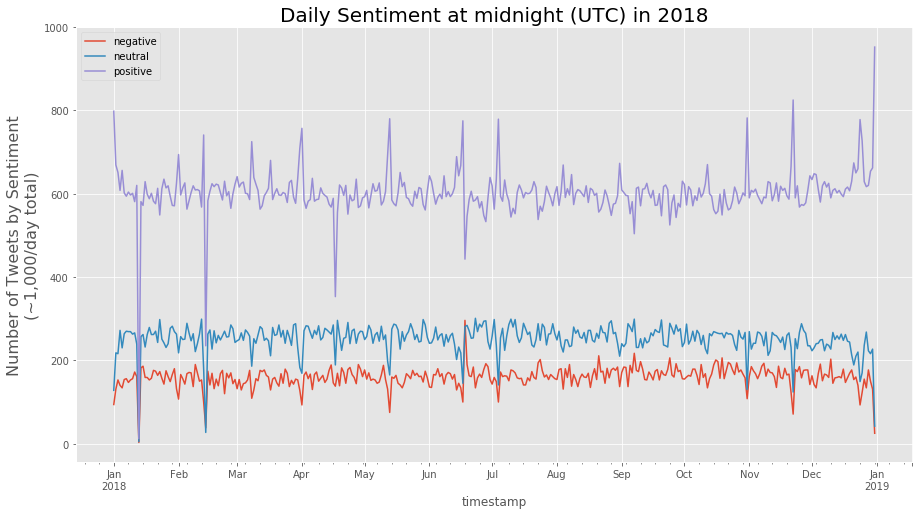

In [18]:
plot_sentiments('tweets_happysad_2018.csv', 2018)

#### Seasonal Decomposition

Let's use statsmodels' `seasonal_decomposition` method to determine whether our dataset exhibits any seasonality.

In [19]:
# Make a dictionary for each sentiment
t2018 = {}
for sentiment in grouped.sentiment.unique():
    temp = grouped[grouped.sentiment == sentiment].set_index('timestamp')
    temp.drop('sentiment', axis=1, inplace=True)
    t2018[sentiment] = temp
    
# Log transform the values to prepare it for Seasonal Decomposition
t2018_log = {}
for sentiment in t2018.keys():
    t2018_log[sentiment] = np.log(t2018[sentiment])

In [20]:
# Define a function to decompose a time series, in order to detect
# trends and seasonality, and allow for examining the residuals
def df_decompose(df):
    # Gather the trend, seasonality and noise of decomposed object
    trend = sd(df).trend
    seasonal = sd(df).seasonal
    residual = sd(df).resid

    # Plot gathered statistics
    plt.figure(figsize=(12,8))
    plt.title(f"Decomposition for {df}")
    plt.subplot(411)
    plt.plot(df, label='Original', color="blue")
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color="blue")
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal, label='Seasonality', color="blue")
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color="blue")
    plt.legend(loc='best')
    plt.tight_layout();
    
    return residual.dropna()

negative
neutral
positive


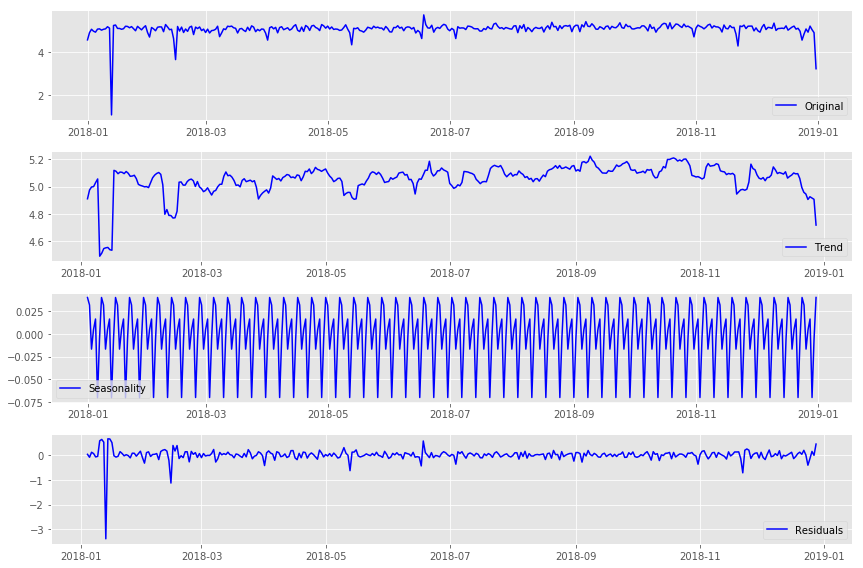

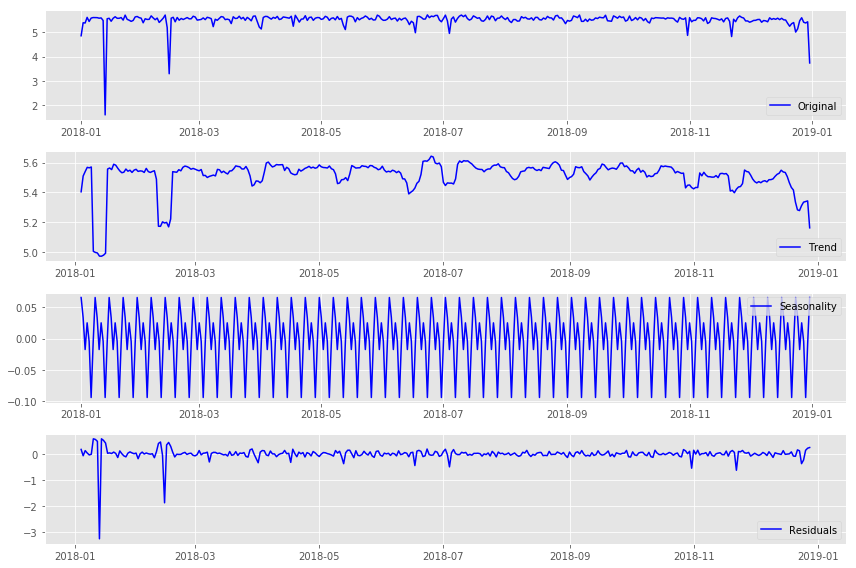

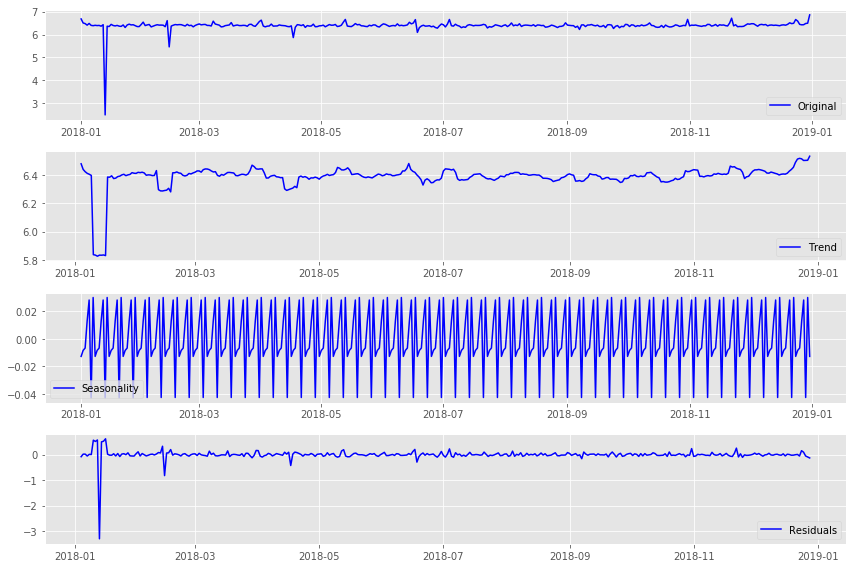

In [21]:
for sentiment in grouped.sentiment.unique():
    print(sentiment)
    df_decompose(t2018_log[sentiment])

**Based on these decomposition graphs, it seems pretty clear that tweet sentiment is subject to seasonality on the scale of about a week.**

However, this presents us with a problem: Is the sentiment seasonality tied to the work week or to the lunar week?

Though lunar weeks are on average 7 days long, this is not an exact number which is why full moons do not occur on the same weekday throughout the year. Bearing this in mind, we need to develop some basic models to see if our data's seasonality is only affected by calendar weeks, only by lunar weeks, or some combination of the two. My preliminary hypothesis going in will be that calendar weeks are the driving force, but that lunar cycles also have a small impact. 

This is a fairly tricky problem to solve, but fortunately Facebook's Prophet library has precisely the features we need to solve it.

# 4. Modeling

## Using Facebook Prophet to decode multiple seasonalities

https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html

In [22]:
#prepare grouped sentiment data for FBProphet processing
grp_pos = grouped[grouped.sentiment == 'positive'].drop('sentiment', axis=1).reset_index(drop=True)
grp_pos.columns = ['ds','y']
display(grp_pos.head())

grp_neg = grouped[grouped.sentiment == 'negative'].drop('sentiment', axis=1).reset_index(drop=True)
grp_neg.columns = ['ds','y']

grp_neut = grouped[grouped.sentiment == 'neutral'].drop('sentiment', axis=1).reset_index(drop=True)
grp_neut.columns = ['ds','y']

,ds,y
0,2018-01-01,798
1,2018-01-02,669
2,2018-01-03,651
3,2018-01-04,608
4,2018-01-05,656


### Using FBProphet to examine tweets with 'positive' sentiment

In [23]:
# Using FBProphet on tweets with 'positive' sentiment
m = Prophet()
m.fit(grp_pos)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [24]:
future = m.make_future_dataframe(periods=56)
future.tail()

,ds
416,2019-02-21
417,2019-02-22
418,2019-02-23
419,2019-02-24
420,2019-02-25


In [25]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
416,2019-02-21,660.962459,587.052321,730.800196
417,2019-02-22,670.136509,595.504091,747.821259
418,2019-02-23,661.883085,587.708687,741.753577
419,2019-02-24,671.937787,596.818057,746.411525
420,2019-02-25,656.608474,584.356801,728.606134


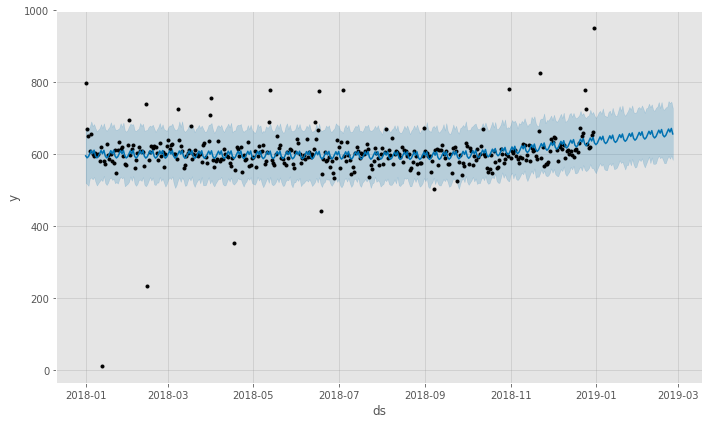

In [26]:
fig1 = m.plot(forecast)

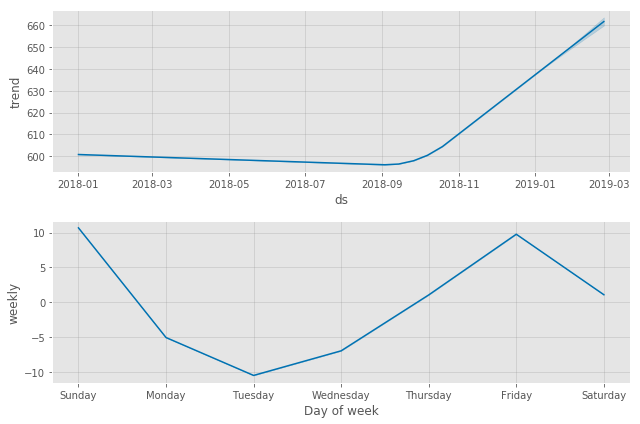

In [27]:
fig2 = m.plot_components(forecast)

In [28]:
# Let's make an interactive graph of this forecast, just for fun!
py.init_notebook_mode()

fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

#### Now to take the lunar phase dates into account

In [29]:
# Define functions to automate the process of inspecting lunar trends

def get_lunar_phases(year='2018'):
    "Given a year, returns a dataframe of lunar phases, dates, and times (UTC)."
    url = f"https://aa.usno.navy.mil/cgi-bin/aa_phases.pl?year={year}&nump=65&format=t"
    res_page = requests.get(url)
    soup = BeautifulSoup(res_page.content, 'html.parser')
    table_cells = soup.find_all("td")
    output = pd.DataFrame(columns=['phase','date','time'])
    for i in range(len(table_cells)):
        row = np.floor(i/2)
        if i%2 == 0:
            output.at[row,'phase'] = table_cells[i].text
        else:
            output.at[row,'date'] = table_cells[i].text[:12]  #need to grab just beggining of string
            output.at[row,'time'] = table_cells[i].text[-5:]  #need to grab just ending of string
    output.date = pd.to_datetime(output.date)
    output.reset_index(drop=True, inplace=True)
    return output


def lunar_phase_separator(phases_df, lower_window=0, upper_window=1):
    """
    Converts DataFrame of moon phases into FBProphet-friendly format.
    ---------------------
    Inputs:
    phases_df       DataFrame containing lunar phase dates for a given year
                        (the output of the `get_lunar_phases()` function)
    lower_window    (<=0) number of days prior to moon phase to include in 'holiday'
    upper_window    (>=0) number of days after to moon phase to include in 'holiday'
    ---------------------
    Returns:        FBProphet-friendly DataFrame for use in 'holiday' parameter
    """
    # let's separate the different moon phases
    phase_names = ['Full Moon','Last Quarter','New Moon','First Quarter']
    ph_list = []
    for phase in phase_names:
        moons = pd.DataFrame(phases_df.loc[phases_df['phase'] == phase]['date']).reset_index(drop=True)
        moons.columns = ['ds']
        moons['holiday'] = str(phase).lower().replace(" ", "")
        moons['lower_window'] = lower_window
        moons['upper_window'] = upper_window
        ph_list.append(moons)
    phases = pd.concat((ph_list[0], ph_list[1], ph_list[2], ph_list[3]))
    return phases

In [30]:
# create a DataFrame of 2018 lunar phases
try:
    phases_2018_df = get_lunar_phases(year='2018')
except:
    phases_2018_df = get_lunar_phases(year='2018')

phases = lunar_phase_separator(phases_2018_df, lower_window=0, upper_window=1)

### NOTE: if this block fails, just run it again after a few seconds (API is finicky)


In [31]:
# again, modeling the 'positive' tweets
m = Prophet(holidays=phases)
forecast = m.fit(grp_pos).predict(future)
forecast[(forecast['fullmoon'] + forecast['lastquarter'] + 
          forecast['newmoon'] + forecast['firstquarter']).abs() > 
         0][['ds', 'fullmoon', 'lastquarter', 'newmoon','firstquarter']][:10]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
1,2018-01-02,6.834110,0.000000,0.000000,0.000000
2,2018-01-03,21.937384,0.000000,0.000000,0.000000
7,2018-01-08,0.000000,25.643439,0.000000,0.000000
8,2018-01-09,0.000000,6.101736,0.000000,0.000000
16,2018-01-17,0.000000,0.000000,6.045609,0.000000
17,2018-01-18,0.000000,0.000000,-18.487566,0.000000
23,2018-01-24,0.000000,0.000000,0.000000,-2.923024
24,2018-01-25,0.000000,0.000000,0.000000,-14.008650
30,2018-01-31,6.834110,0.000000,0.000000,0.000000
31,2018-02-01,21.937384,0.000000,0.000000,0.000000


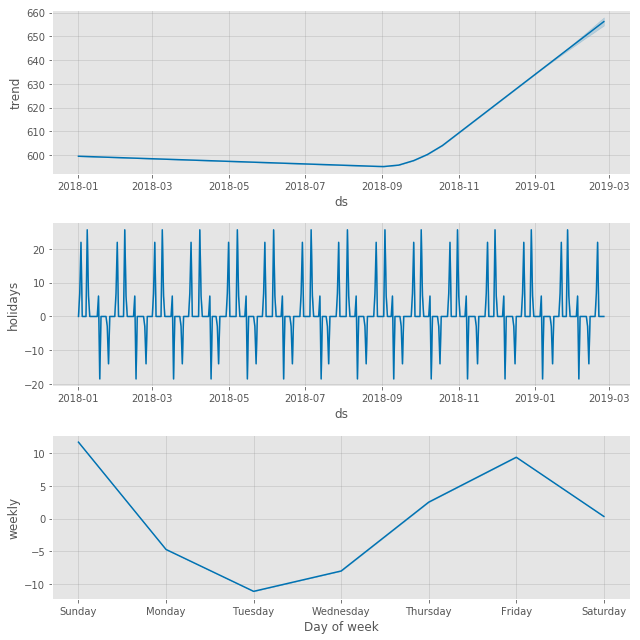

In [32]:
fig = m.plot_components(forecast)

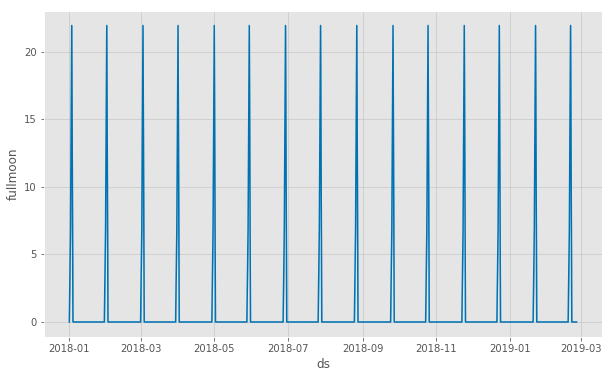

In [33]:
# if you want to just plot only one of the holiday types, run the code below:
from fbprophet.plot import plot_forecast_component
plot_forecast_component(m, forecast, 'fullmoon')

**Wow! This is amazing! It sure looks like lunar cycles impact Twitter sentiment, but we should perform some cross validations and look at performance metrics to make sure our eyes aren't deceiving us.**

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


,horizon,mse,rmse,mae,mape,coverage
0,3 days,916.002710,30.265537,23.491773,0.039452,1.000000
1,4 days,963.903332,31.046793,25.033482,0.042785,1.000000
2,5 days,1203.249250,34.687883,26.912787,0.046313,0.960784
3,6 days,2001.677526,44.740111,27.639332,0.045223,0.941176
4,7 days,2219.958346,47.116434,28.668927,0.046299,0.921569
5,8 days,2552.626419,50.523523,29.246045,0.045890,0.941176
6,9 days,2045.693940,45.229348,29.973995,0.049673,0.941176
7,10 days,2839.922098,53.290919,38.775151,0.064387,0.882353
8,11 days,2593.144968,50.922932,38.411092,0.064868,0.882353
9,12 days,3422.308837,58.500503,38.122122,0.069056,0.882353


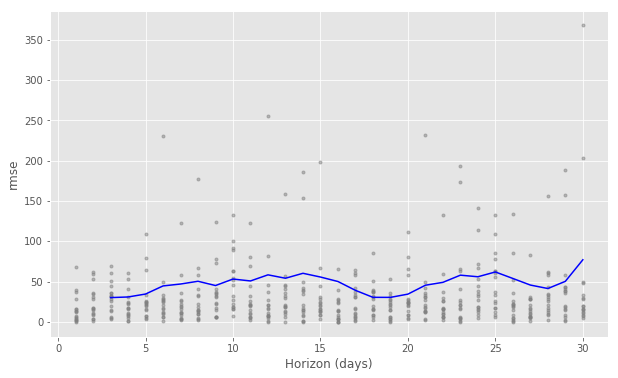

In [34]:
# cross validating using time horizons within the dataset
df_cv = cross_validation(m, initial='90 days', period='15 days', horizon = '30 days')

# performance metrics for the FBProphet model
df_p = performance_metrics(df_cv)
display(df_p.head(16))

# plotting performance metrics
fig = plot_cross_validation_metric(df_cv, metric='rmse')

The graph imediately above shows that, based on the crossvalidations that were performed, the FBProphet model averages an error rate of 30-50 tweets (per 1,000) for predictions up to a month into the future.

### It appears that Lunar Cycles have a considerable correlation to Tweet Sentiment shifts!

Looking at the `holidays` graph above, it is apparent that full moons and last quarter moons have the most profound (and positive) correlation on the proportion of tweets that express positive sentiment. Surprisingly, new moons and first quarter moons actually exhibit a *negative* correlation to positive sentiment!

Let's look at some stock data to see if this trend carries over to financial markets.

In [37]:
# Define functions to automate the process of inspecting lunar trends
def prep_data_for_FBP(data, column_name):
    """
    Given a DataFrame and the name of the column to be processed, 
    generates a FBProphet-ready DataFrame.
    """
    d = data.reset_index()
    prepped_data = d[['date', column_name]].sort_values(by=['date']).reset_index(drop=True)
    prepped_data.columns = ['ds','y']
    return prepped_data


def cross_val_FBP(model, metric='rmse', show_metric_scores=False):
    # cross validating using time horizons within the dataset
    df_cv = cross_validation(model, initial='90 days', period='15 days', horizon = '30 days')
    # performance metrics for the FBProphet model
    df_p = performance_metrics(df_cv)
    if show_metric_scores == True:
        display(df_p.head())
    # plotting performance metrics
    fig = plot_cross_validation_metric(df_cv, metric)
    pass


def get_weekends(year=2018):
    """For stocks/currencies that don't trade on weekends, we need 
    to tell FBProphet to ignore weekends. This function generates a 
    dataframe of weekends for a given year to be used for that purpose.
    """
    weekends_df = pd.DataFrame(columns=['date','day_of_week'])
    weekends_df.date = [date for date in pd.date_range(start=f'1/1/{year}', periods=470)]
    weekends_df.day_of_week = [datetime.datetime(int(str(date)[:4]), 
        int(str(date)[5:7]), int(str(date)[8:10])).weekday() for date in weekends_df.date]
    weekends_df = weekends_df[weekends_df.day_of_week >= 5].reset_index(drop=True)
    return weekends_df


def lunar_stock_trend(df, column_name, phases_df,
                      symbol="TICKETsymbol", year=2018,
                      lower_window=0, upper_window=1,
                      trades_on_weekends=False,
                      cross_val=True, metric='rmse',
                      show_metric_scores=False):
    """
    This function takes in a DataFrame of stock data and the 
    column name for the feature to be examined, a DataFrame of lunar 
    phases for a year, the desired year, and the lower & upper 
    windows for 'holiday' dates.
    
    If the financial data contains values for weekends, set the
    'trades_on_weekends' parameter to 'True'.
    
    Additional options to cross-validate FBProphet model predictions, and
    select from a variety of metrics to use.
    
    ----------------------------------------------------
    
    Returns a list containing the model object, the 'future' dataframe
    used to make predictions, the forecast output DataFrame, a graph
    of the forecast, and a graph of forecast components.
    """
    phases = lunar_phase_separator(phases_df, lower_window, upper_window)
    if trades_on_weekends == False:
        weekends_df = get_weekends(year)
        phases = phases[~phases['ds'].isin(weekends_df.date)]
    data = prep_data_for_FBP(df, column_name)
    
    plot_financial_data(df=df, symbol=symbol, column='close_24', year=year)
    plot_financial_data(df=df, symbol=symbol, column=column_name, year=year)

    m = Prophet(holidays=phases)
    m.fit(data)
    future = m.make_future_dataframe(periods=60, freq='D')
    if trades_on_weekends == False:
        future = future[~future['ds'].isin(weekends_df.date)]
    forecast = m.predict(future)
    disp_length = 4 * (1 + abs(lower_window) + abs(upper_window))
    display(forecast[(forecast['fullmoon'] + forecast['lastquarter'] + 
                      forecast['newmoon'] + forecast['firstquarter']).abs() > 
                     0][['ds', 'fullmoon', 'lastquarter', 'newmoon',
                         'firstquarter']][:disp_length])        
    fig1 = m.plot(forecast);
    fig1.set_size_inches(15, 5);
    fig2 = m.plot_components(forecast)
    fig2.set_size_inches(15, 10);
    if cross_val:
        cross_val_FBP(m, metric, show_metric_scores)
        
    return [m, fig1, fig2]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
0,2018-01-01,-0.001112,0.000000,0.000000,0.000000
1,2018-01-02,-0.000852,0.000000,0.000000,0.000000
2,2018-01-03,0.001742,0.000000,0.000000,0.000000
5,2018-01-08,0.000000,-0.001992,0.000000,0.000000
6,2018-01-09,0.000000,-0.000270,0.000000,0.000000
11,2018-01-16,0.000000,0.000000,0.000724,0.000000
12,2018-01-17,0.000000,0.000000,0.000350,0.000000
13,2018-01-18,0.000000,0.000000,-0.003139,0.000000
16,2018-01-23,0.000000,0.000000,0.000000,0.001664
17,2018-01-24,0.000000,0.000000,0.000000,0.000903


INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


 <Figure size 1080x360 with 1 Axes>,
 <Figure size 1080x720 with 3 Axes>]

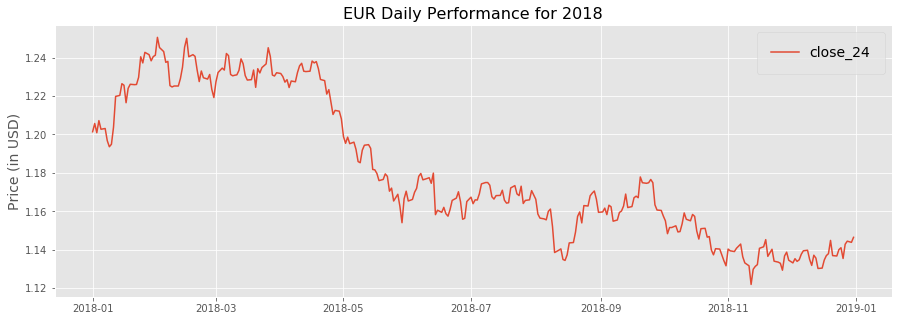

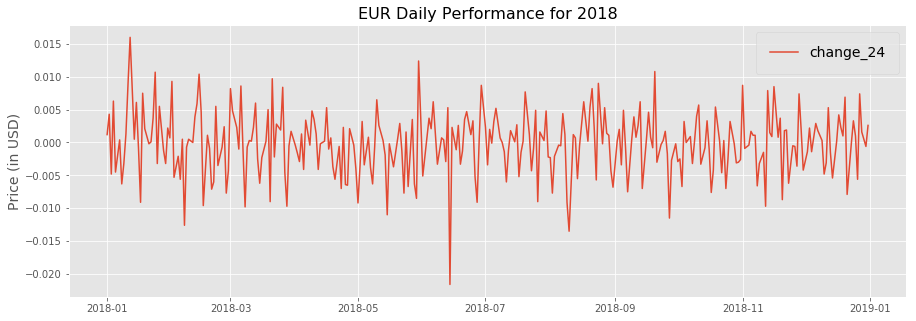

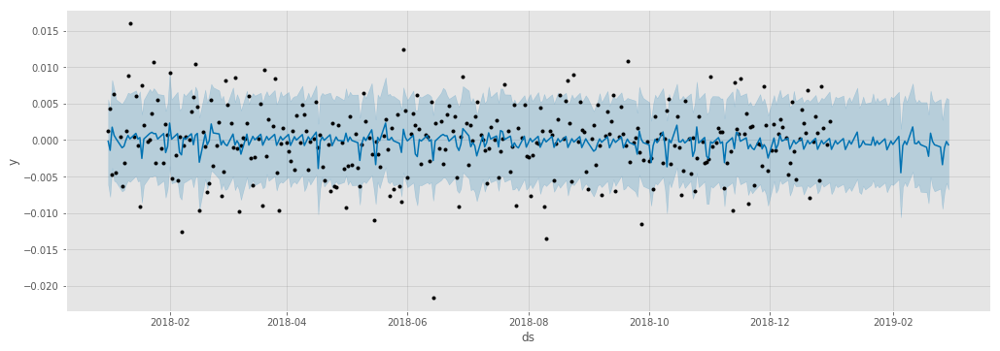

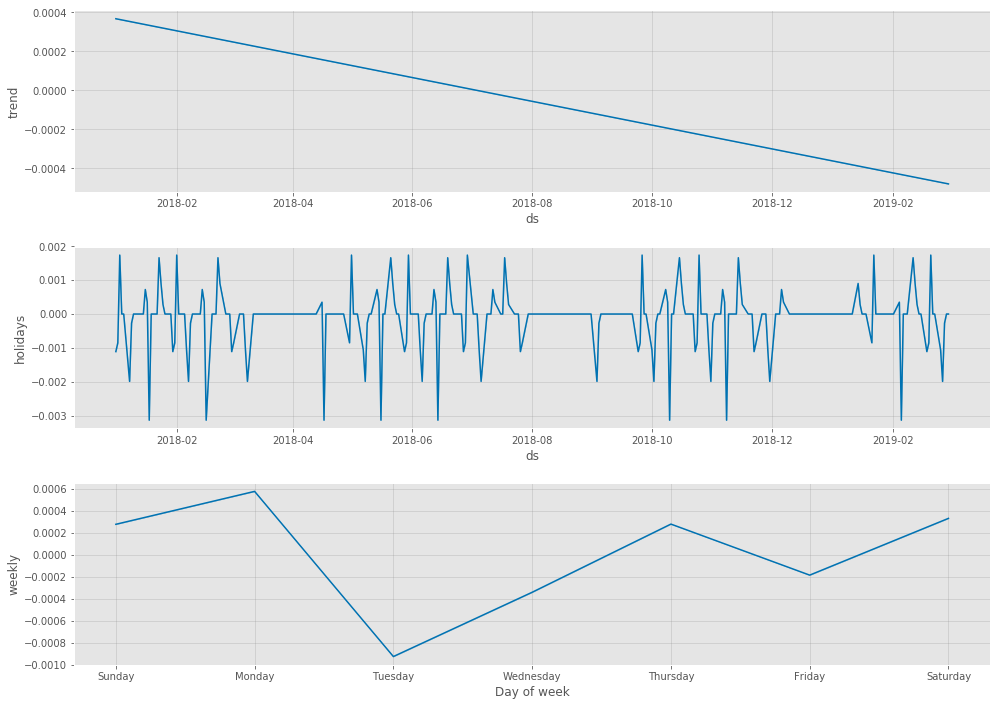

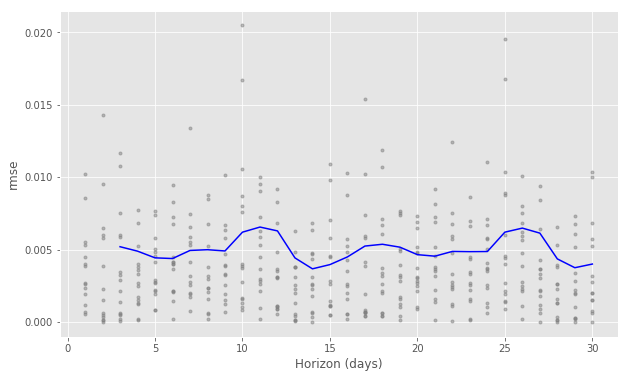

In [38]:
lunar_stock_trend(df=EUR_2018,
                  column_name='change_24',  ###NOTE: here we're examining daily change, not closing prices
                  phases_df=phases_2018_df,
                  symbol='EUR',
                  year=2018,
                  lower_window=-1,
                  upper_window=1,
                  trades_on_weekends=False,
                  cross_val=True,
                  metric='rmse', 
                  show_metric_scores=False)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
0,2018-01-01,-0.001112,0.000000,0.000000,0.000000
1,2018-01-02,-0.000852,0.000000,0.000000,0.000000
2,2018-01-03,0.001742,0.000000,0.000000,0.000000
5,2018-01-08,0.000000,-0.001992,0.000000,0.000000
6,2018-01-09,0.000000,-0.000270,0.000000,0.000000
11,2018-01-16,0.000000,0.000000,0.000724,0.000000
12,2018-01-17,0.000000,0.000000,0.000350,0.000000
13,2018-01-18,0.000000,0.000000,-0.003139,0.000000
16,2018-01-23,0.000000,0.000000,0.000000,0.001664
17,2018-01-24,0.000000,0.000000,0.000000,0.000903


INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


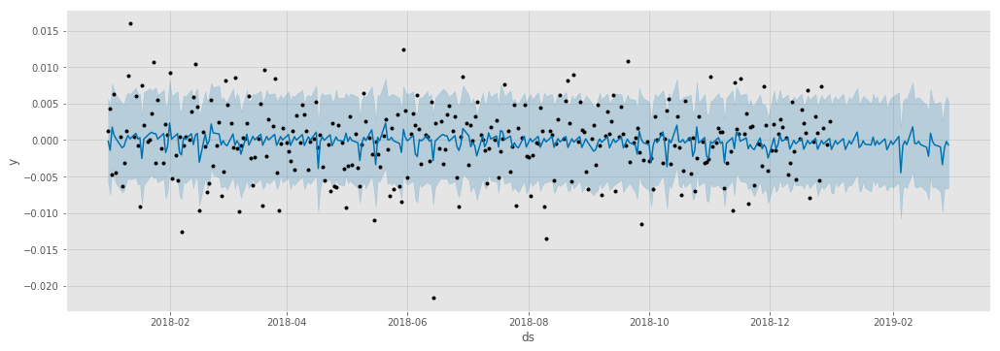

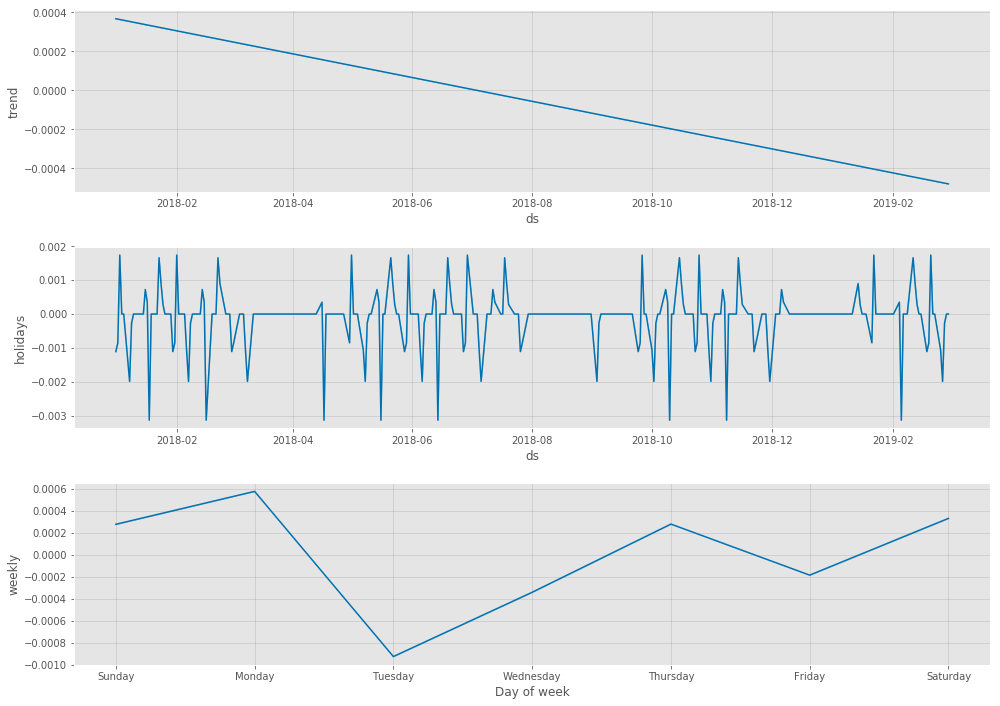

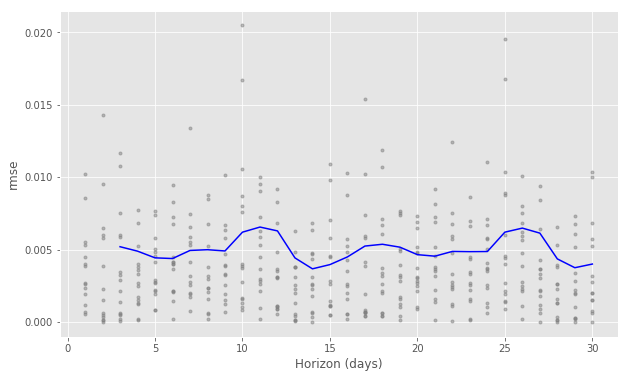

In [37]:
euro_test = lunar_stock_trend(df=EUR_2018,
                  column_name='change_24',
                  phases_df=phases_2018_df,
                  symbol='EUR',
                  year=2018,
                  lower_window=-1,
                  upper_window=1,
                  trades_on_weekends=False,
                  cross_val=True,
                  metric='rmse', 
                  show_metric_scores=False)

**Wow! Financial markets are also exhibiting lunar cycle influences!** However, in the case of the Euro, it seems the impact is pretty small. Nevertheless, there is a distinct pattern correlating to the four lunar phases. Surprisingly, the *new moon* appears to be the most influential, with influence decreasing throughout the rest of the lunar cycle.

We need to dig in a bit deeper, but the graph of the Euro-USDollar exchange market pretty clearly exhibits responses to lunar cycles. Keep in mind that physical currencies are only traded 6 days a week (approximately), stocks are traded 5 days a week, and digital currencies are traded 24/7/365. 

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
0,2018-01-01,-144.434341,0.000000,0.000000,0.000000
1,2018-01-02,133.505534,0.000000,0.000000,0.000000
2,2018-01-03,-51.718049,0.000000,0.000000,0.000000
6,2018-01-07,0.000000,-23.348118,0.000000,0.000000
7,2018-01-08,0.000000,-185.604582,0.000000,0.000000
8,2018-01-09,0.000000,-12.426485,0.000000,0.000000
15,2018-01-16,0.000000,0.000000,-211.835801,0.000000
16,2018-01-17,0.000000,0.000000,-42.447892,0.000000
17,2018-01-18,0.000000,0.000000,65.306596,0.000000
22,2018-01-23,0.000000,0.000000,0.000000,-34.990134


INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


 <Figure size 1080x360 with 1 Axes>,
 <Figure size 1080x720 with 3 Axes>]

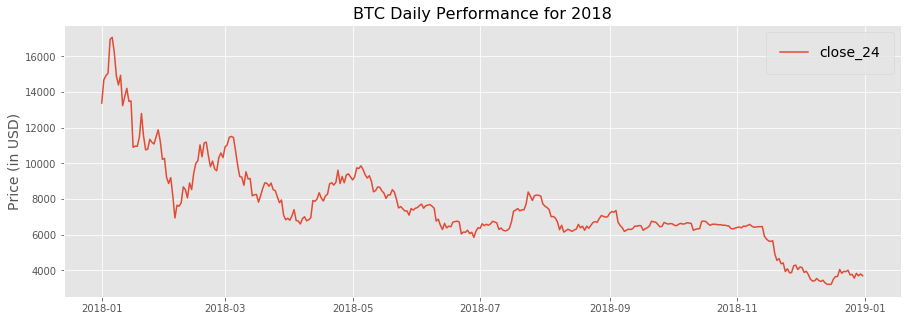

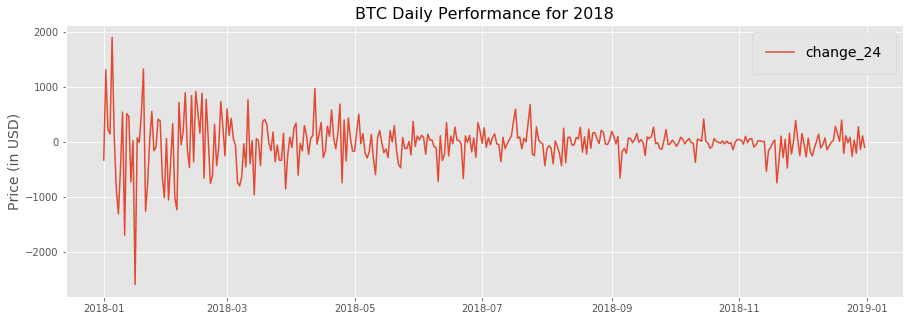

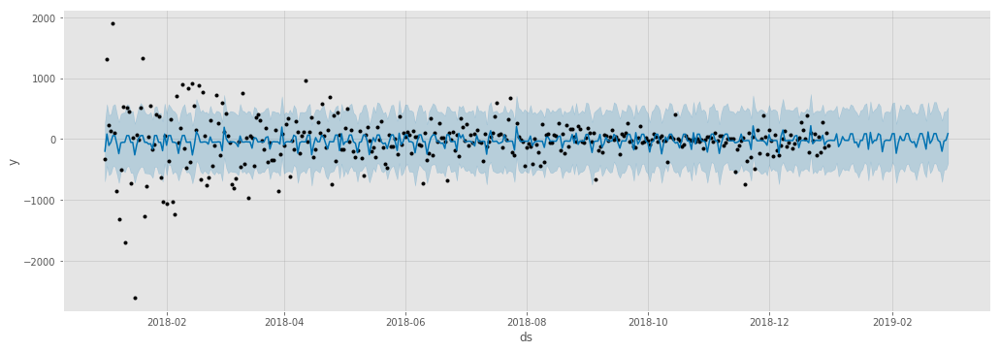

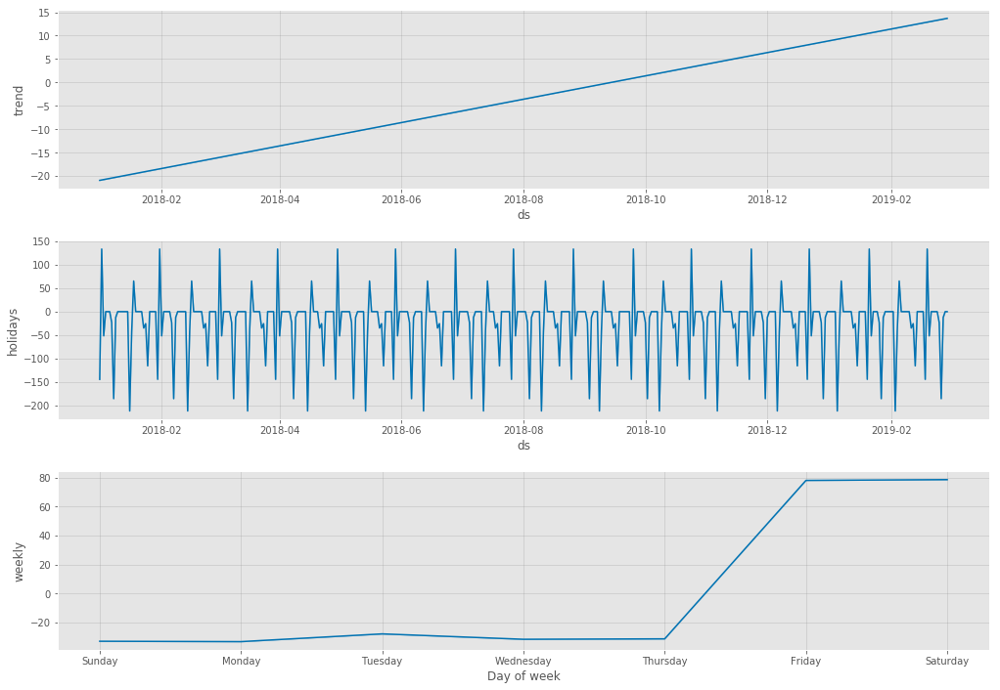

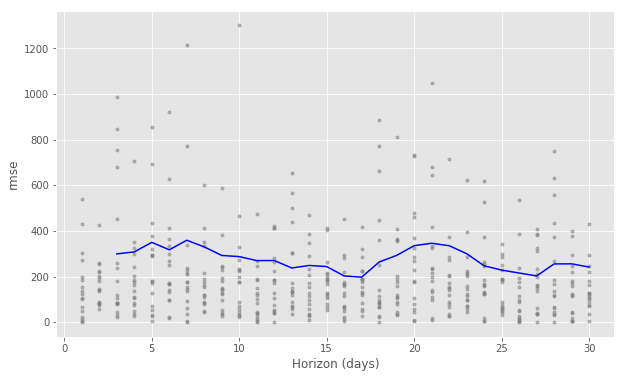

In [41]:
lunar_stock_trend(df=BTC_2018,
                  column_name='change_24',
                  phases_df=phases_2018_df,
                  symbol="BTC",
                  year=2018,
                  lower_window=-1,
                  upper_window=1,
                  trades_on_weekends=True,
                  cross_val=True,
                  metric='rmse', 
                  show_metric_scores=False)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
0,2018-01-02,-6.526015,0.000000,0.000000,0.000000
1,2018-01-03,0.606176,0.000000,0.000000,0.000000
4,2018-01-08,0.000000,21.731553,0.000000,0.000000
5,2018-01-09,0.000000,-8.681575,0.000000,0.000000
9,2018-01-16,0.000000,0.000000,17.390890,0.000000
10,2018-01-17,0.000000,0.000000,1.875532,0.000000
11,2018-01-18,0.000000,0.000000,-14.099491,0.000000
14,2018-01-23,0.000000,0.000000,0.000000,1.099172
15,2018-01-24,0.000000,0.000000,0.000000,12.110732
16,2018-01-25,0.000000,0.000000,0.000000,1.636015


INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


 <Figure size 1080x360 with 1 Axes>,
 <Figure size 1080x720 with 3 Axes>]

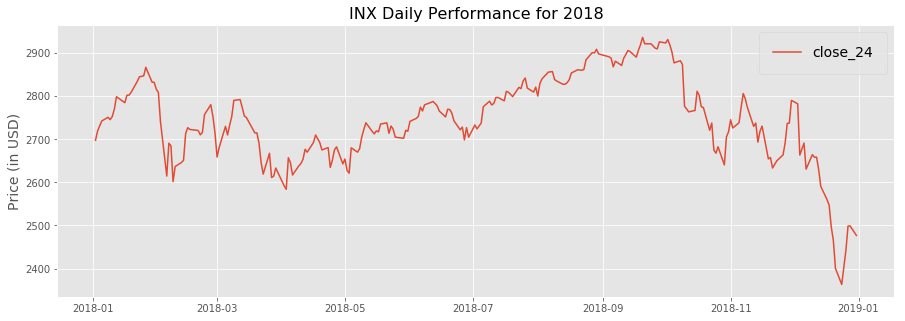

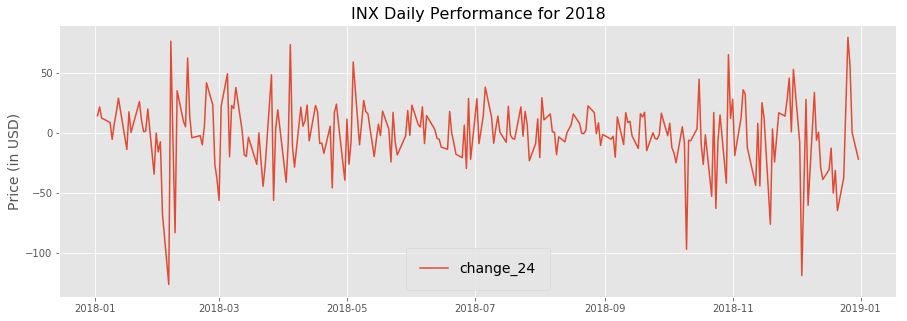

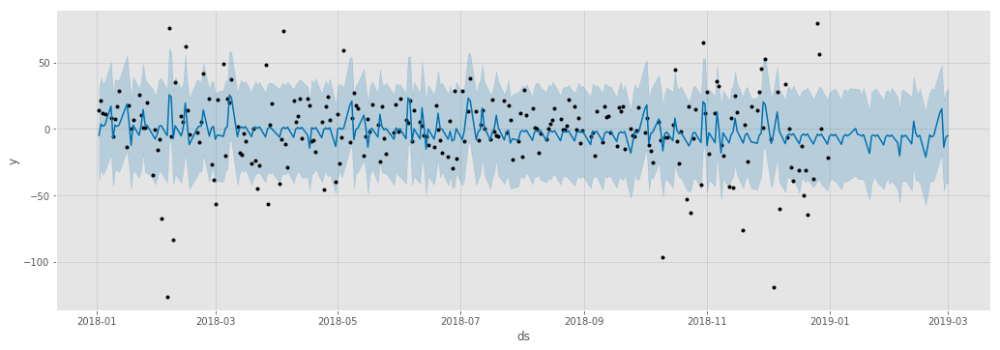

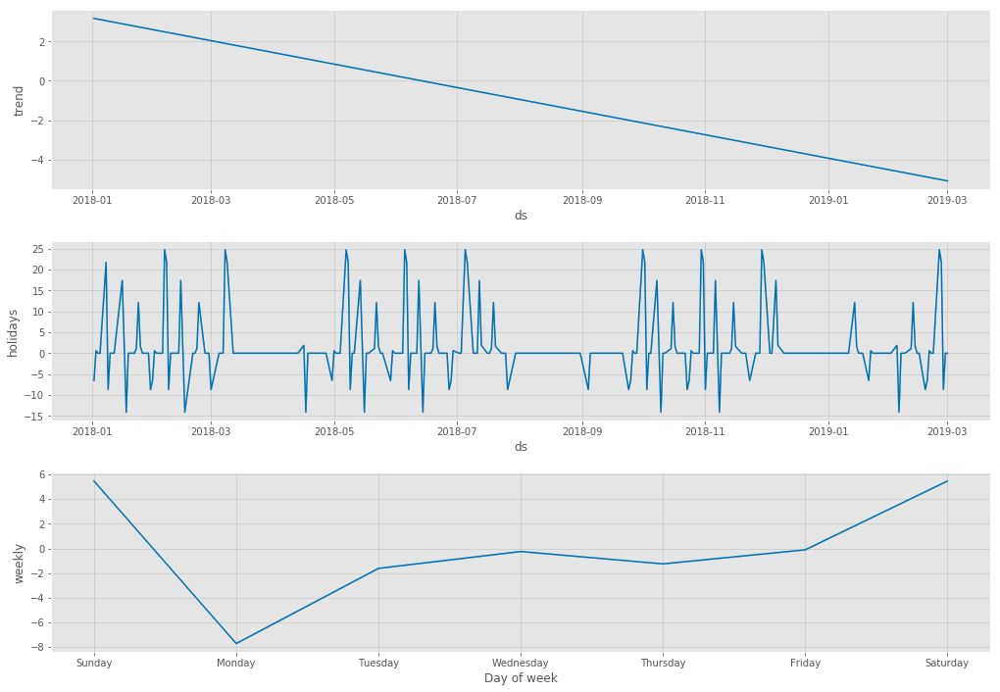

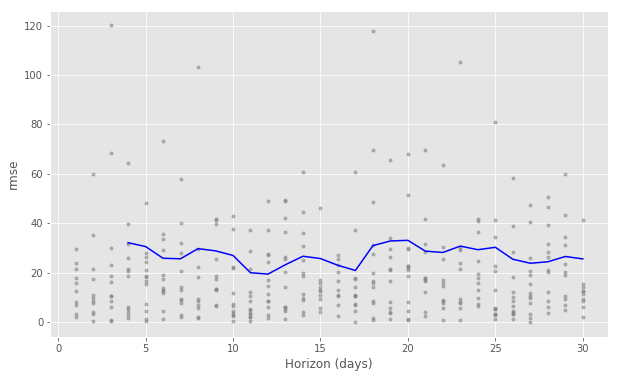

In [42]:
lunar_stock_trend(df=SP500_2018,
                  column_name='change_24',
                  phases_df=phases_2018_df,
                  symbol='INX',
                  year=2018,
                  lower_window=-1,
                  upper_window=1,
                  trades_on_weekends=False,
                  cross_val=True,
                  metric='rmse', 
                  show_metric_scores=False)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
0,2018-01-02,-0.311006,0.000000,0.000000,0.000000
1,2018-01-03,-0.048920,0.000000,0.000000,0.000000
4,2018-01-08,0.000000,0.776920,0.000000,0.000000
5,2018-01-09,0.000000,-0.845515,0.000000,0.000000
9,2018-01-16,0.000000,0.000000,0.862164,0.000000
10,2018-01-17,0.000000,0.000000,0.281802,0.000000
11,2018-01-18,0.000000,0.000000,-1.051392,0.000000
14,2018-01-23,0.000000,0.000000,0.000000,-0.005672
15,2018-01-24,0.000000,0.000000,0.000000,1.003438
16,2018-01-25,0.000000,0.000000,0.000000,-0.216455


INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


 <Figure size 1080x360 with 1 Axes>,
 <Figure size 1080x720 with 3 Axes>]

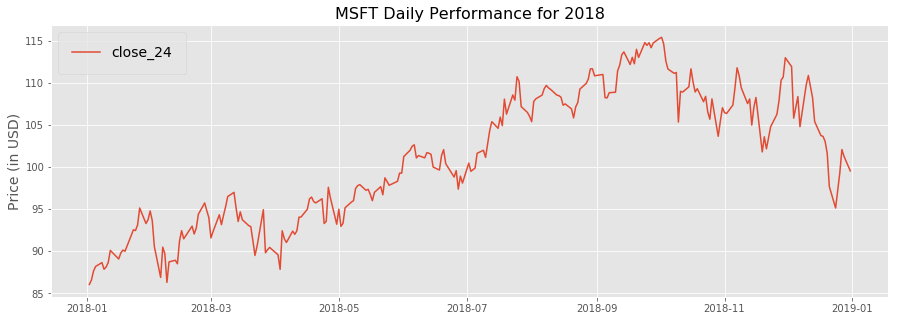

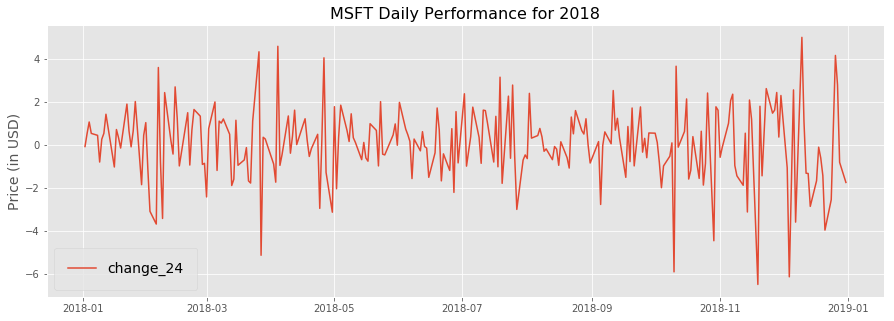

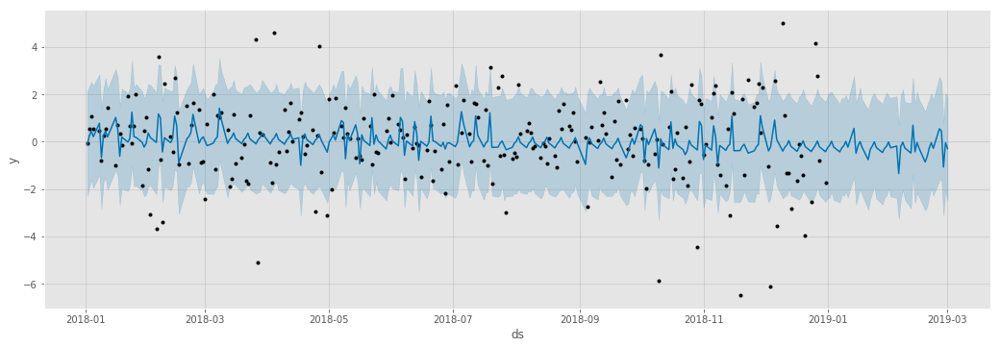

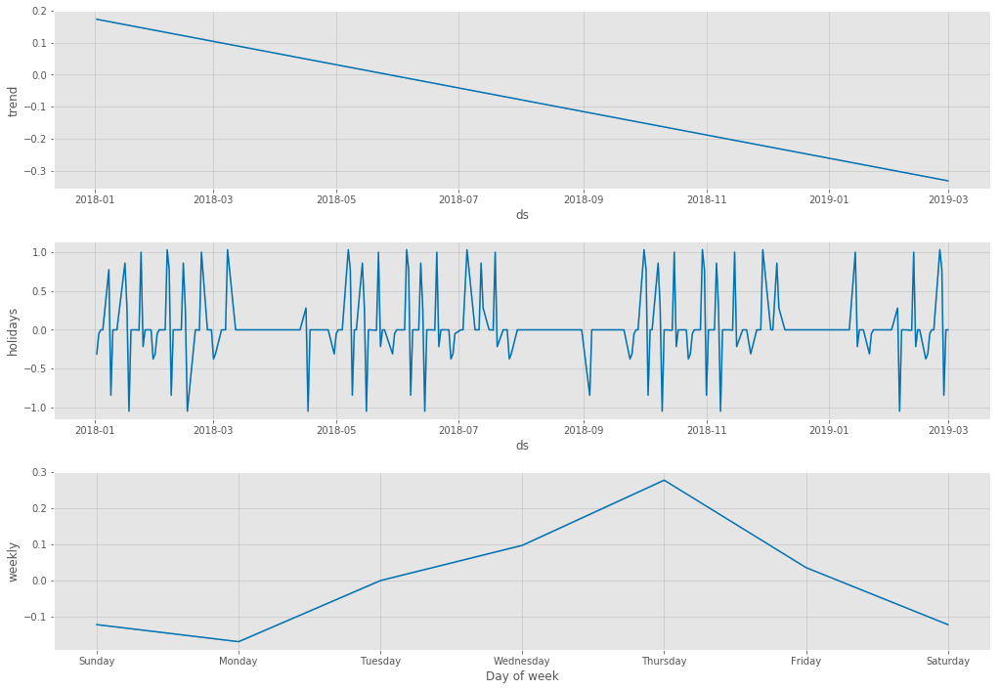

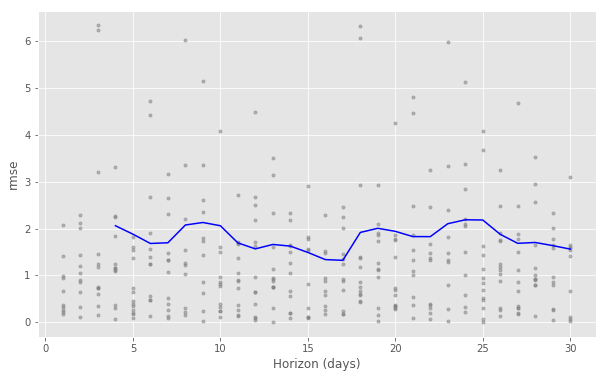

In [43]:
lunar_stock_trend(df=MSFT_2018,
                  column_name='change_24',
                  phases_df=phases_2018_df,
                  symbol='MSFT',
                  year=2018,
                  lower_window=-1,
                  upper_window=1,
                  trades_on_weekends=False,
                  cross_val=True,
                  metric='rmse', 
                  show_metric_scores=False)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,fullmoon,lastquarter,newmoon,firstquarter
0,2018-01-02,0.302088,0.000000,0.000000,0.000000
1,2018-01-03,-0.622047,0.000000,0.000000,0.000000
4,2018-01-08,0.000000,0.385546,0.000000,0.000000
5,2018-01-09,0.000000,-0.450231,0.000000,0.000000
9,2018-01-16,0.000000,0.000000,1.496766,0.000000
10,2018-01-17,0.000000,0.000000,-0.054918,0.000000
11,2018-01-18,0.000000,0.000000,0.325681,0.000000
14,2018-01-23,0.000000,0.000000,0.000000,0.735083
15,2018-01-24,0.000000,0.000000,0.000000,-0.034805
16,2018-01-25,0.000000,0.000000,0.000000,0.779901


INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


 <Figure size 1080x360 with 1 Axes>,
 <Figure size 1080x720 with 3 Axes>]

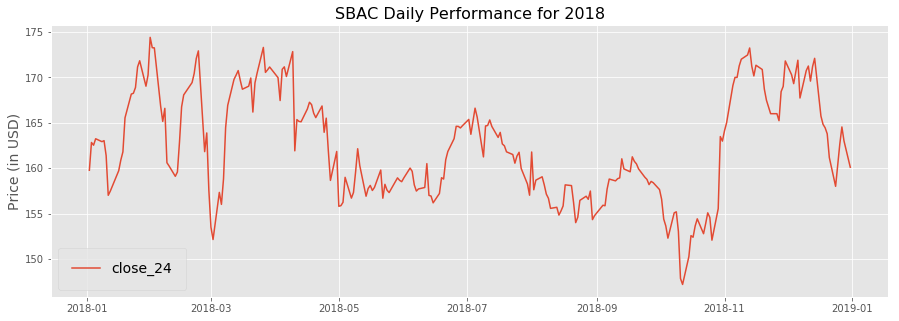

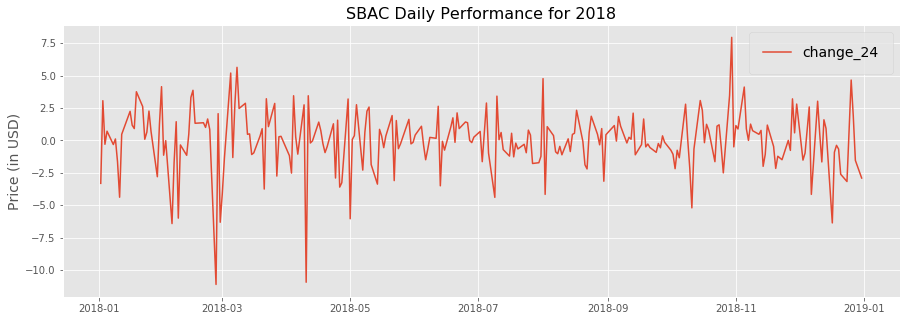

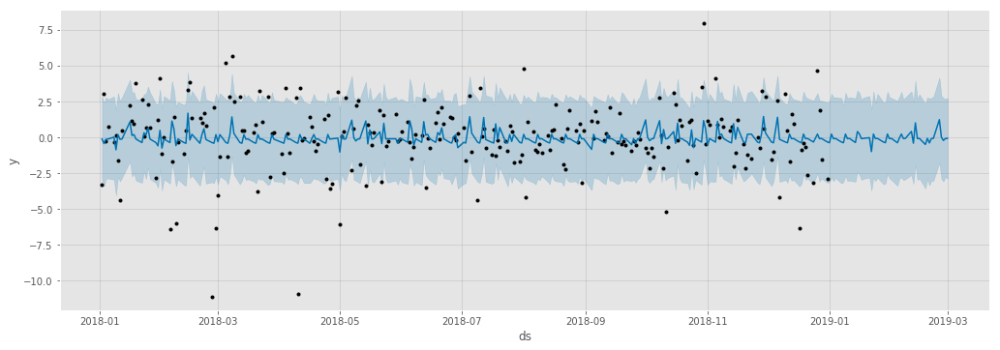

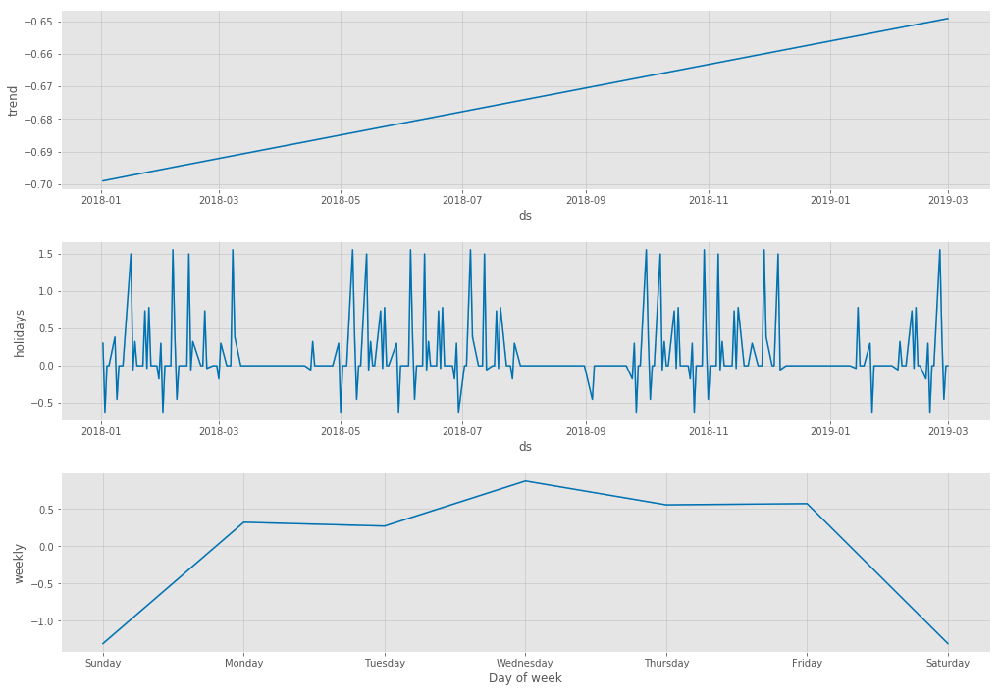

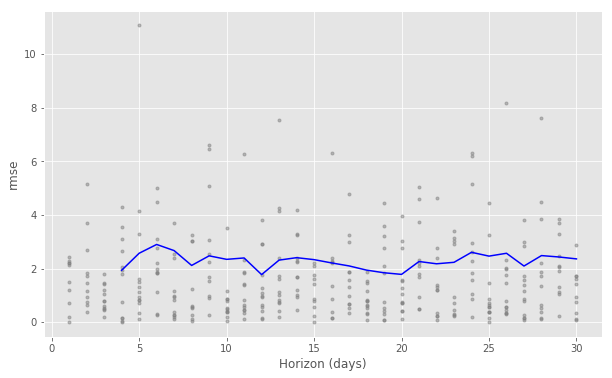

In [46]:
lunar_stock_trend(df=SBAC_2018,
                  column_name='change_24',
                  phases_df=phases_2018_df,
                  symbol='SBAC',
                  year=2018,
                  lower_window=-1,
                  upper_window=1,
                  trades_on_weekends=False,
                  cross_val=True,
                  metric='rmse', 
                  show_metric_scores=False)

**Well, after looking at a stock, a market index, a physical currency, and a cryptocurrency, it seems pretty apparent that there is some sort of lunar-phase-seasonality correlation in financial markets of all sorts.** While it may be a relatively small influence in all cases, the regularity in occurence and uniformity in influence strongly suggests that lunar cycles may have a real and quantifiable influence on human behavior (whether in tweets or financial decisions).

### To facilitate later use, we'll export Tweet & Financial summaries as .csv files

The following two lines have `break`s so that they do not overwrite existing files. Feel free to remove the `break` lines when running the code yourself.

In [62]:
break    ###comment out this line if you want to execute
quers = ['lovehate','happysad','music','money','nowords','politics', 'coding']

In [70]:
break    ###comment out this line if you want to execute

for quer in quers:
    tdf = pd.read_csv(f'tweets_{quer}_2018.csv')
    tdf.timestamp = pd.to_datetime(tw_df.timestamp, format='%Y%m%d')
    grupd = pd.DataFrame(tdf.groupby(['timestamp', 'sentiment'])['tally'].sum()).reset_index()
    grupd = grupd[['timestamp','sentiment','tally']]
    export_csv = grupd.to_csv(path_or_buf=f'tw_{quer}.csv', index=False)
    

# And also the financial data we've scraped
financials = [MSFT_2018, EUR_2018, BTC_2018, SP500_2018, SBAC_2018]
symbols = ['MSFT','EUR','BTC','SP500','SBAC']

for fin, symb in list(zip(financials,symbols)):
    export_csv = fin.to_csv(path_or_buf=f'{symb}.csv', index=True)

# 5. Interpretation

One thing to keep in mind about moon phases is that while scientifically a full moon lasts only an instant, visually it seems to last about three days. This **observational** period of 2-3 days for each moon phase is what I have endeavored to examine in my analysis, as it seems logical that only the perception of a moon phase would affect behavior (or at least correlate to it), not the scientific instant of occurence. 

Generally speaking, it seems that currency exchange rates (e.g. Euro-to-USD exchange) experience positive value spikes on full moons and negative spikes during new moons, while stocks respond in an inverse manner. 

Oddly, it seems that most of the stocks/currencies examined display a particular seasonality behavior for the first half of a moon phase, but then a correction or even a sharp over-correction on the final day of the phase. For instance, the S&P 500 Index (a widely accepted barometer for the U.S. stock market) generally rises by 17.45 USD at the beginning of a new moon, but then generally falls 14.31 USD at the end of the new moon. 




# 6. Bonus Round: NLP Visualizations!

## Running the different tweet searches through FBProphet

In [47]:
tweet_csv_files = ['tweets_lovehate_2018.csv',
                   'tweets_happysad_2018.csv',
                   'tweets_music_2018.csv',
                   'tweets_money_2018.csv',
                   'tweets_nowords_2018.csv',
                   'tweets_politics_2018.csv',
                   'tweets_coding_2018.csv']

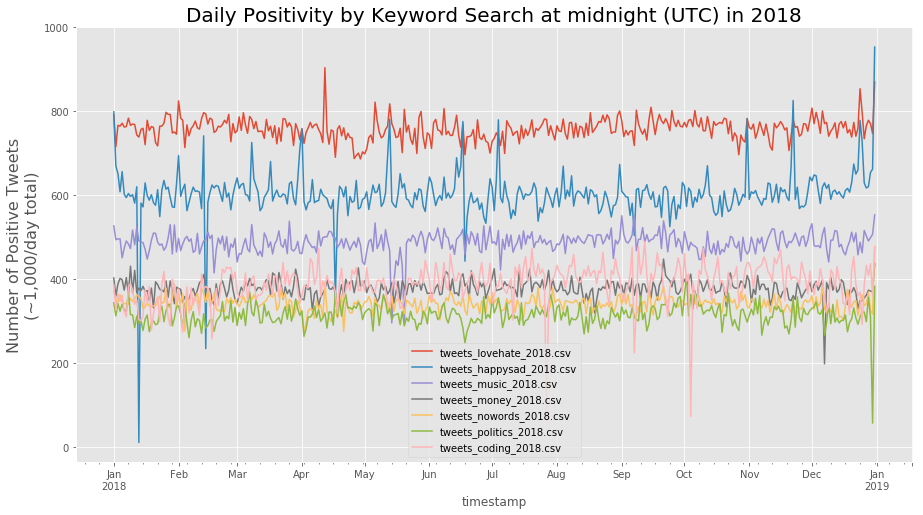

In [48]:
# Exploring daily positivity rates by query phrase
for search in tweet_csv_files:
    plot_sentiments(search, 2018, positive_only=True)

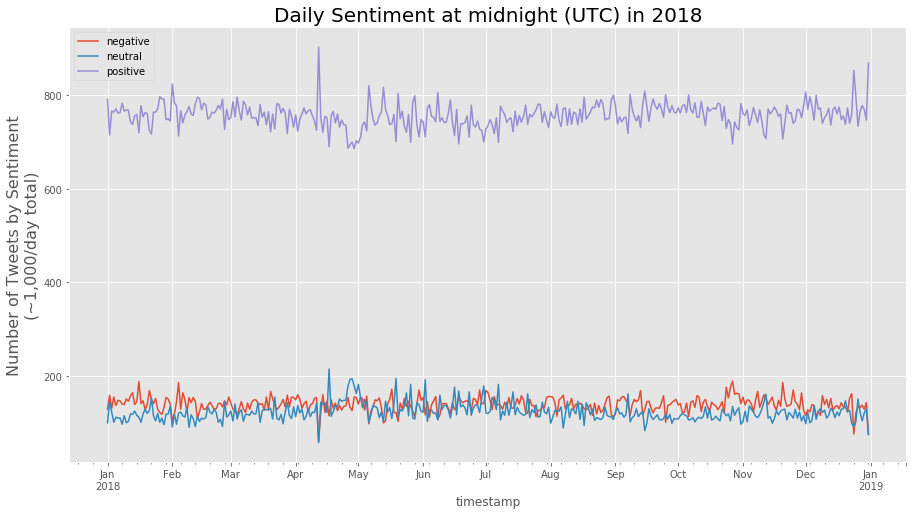

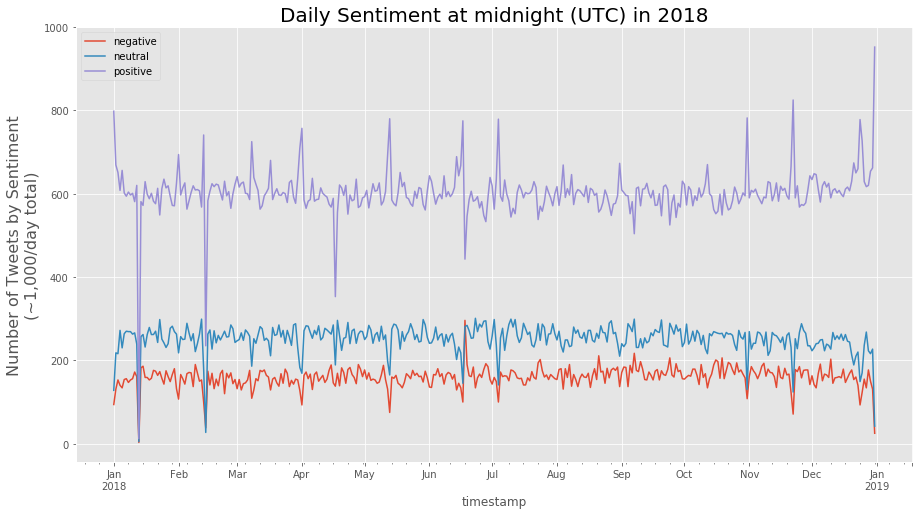

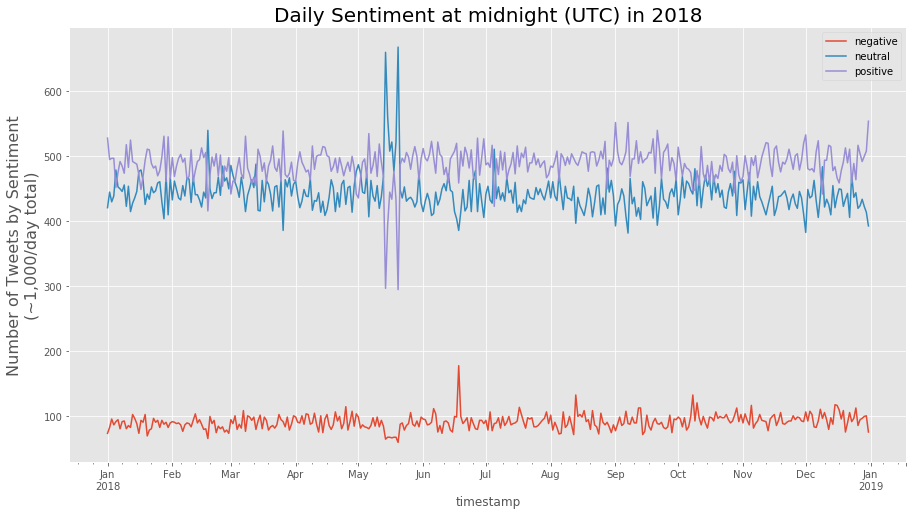

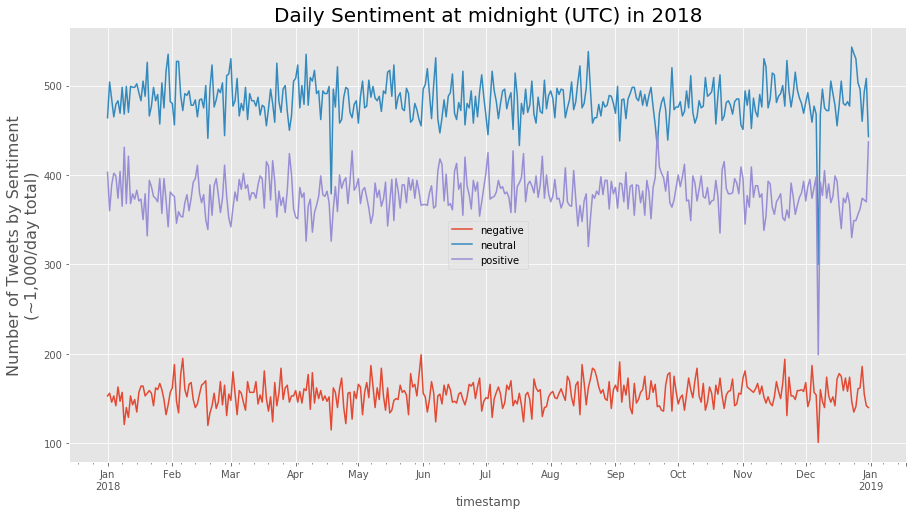

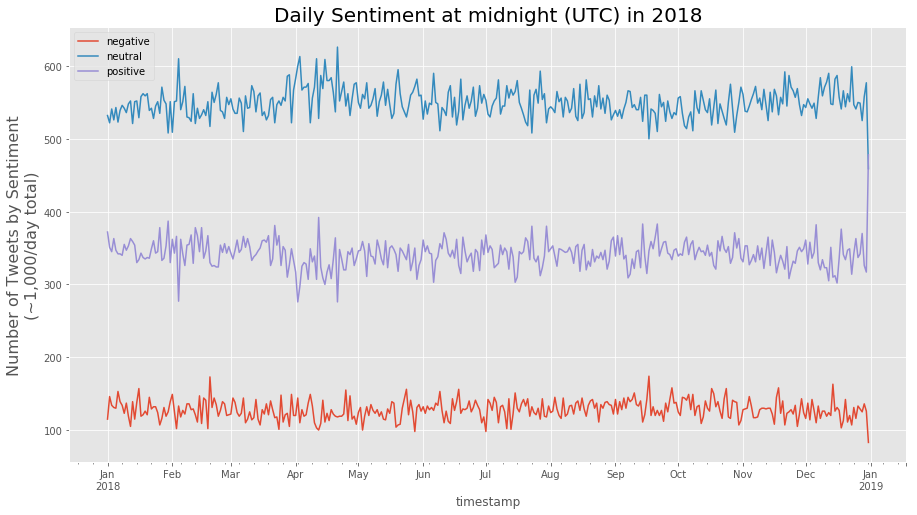

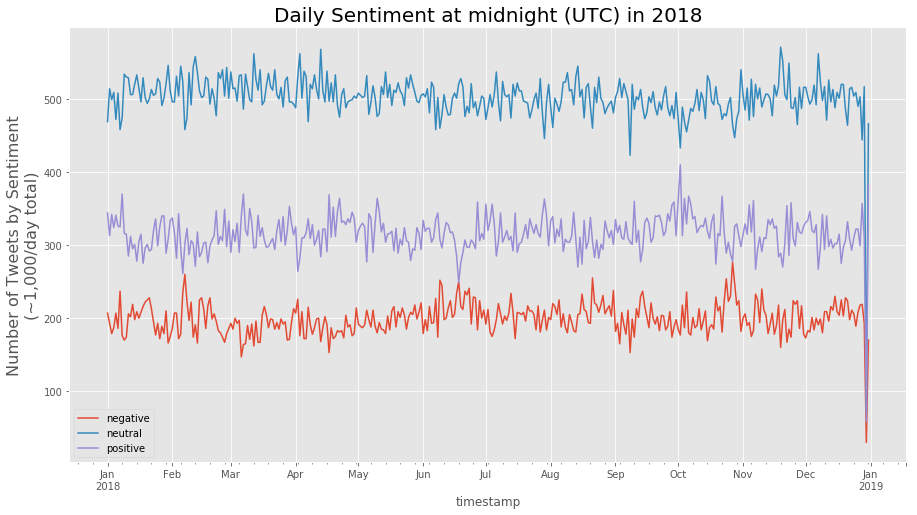

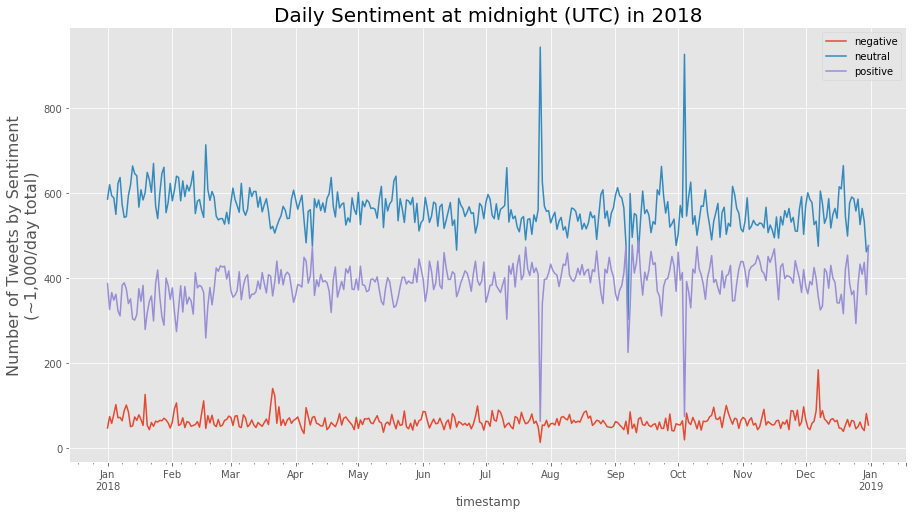

In [49]:
for search in tweet_csv_files:
    plot_sentiments(csv_filename=search, year=2018, positive_only=False)
    plt.show();

In [58]:
def tweet_fbprophet(filename='tweets_nowords_2018.csv', show_metrics=False):
    """This function mimics the FBProphet modeling performed above
    with financial data, this time with scraped/processed tweets.
    Additional option to show cross validation metrics.
    """    
    print(filename)
    tweets_df = pd.read_csv(filename)
    tweets_df.timestamp = pd.to_datetime(tw_df.timestamp, format='%Y%m%d')
    grouped = pd.DataFrame(tweets_df.groupby(['timestamp', 'sentiment'])['tally'].sum()).reset_index()

    #prepare grouped sentiment data for FBProphet processing
    #here, positive sentiment only
    grp_pos = grouped[grouped.sentiment == 'positive'].drop('sentiment', axis=1).reset_index(drop=True)
    grp_pos.columns = ['ds','y']

    m = Prophet(holidays=phases)
    m.fit(grp_pos)
    future = m.make_future_dataframe(periods=60, freq='D')
    forecast = m.predict(future)
    forecast[(forecast['fullmoon'] + forecast['lastquarter'] + 
              forecast['newmoon'] + forecast['firstquarter']).abs() > 
             0][['ds', 'fullmoon', 'lastquarter', 'newmoon','firstquarter']][:10]
    fig1 = m.plot(forecast);
    fig1.set_size_inches(15, 5)
    plt.show();
    fig2 = m.plot_components(forecast)
    fig2.set_size_inches(15, 10)
    plt.show();
    
    # cross validating using time horizons within the dataset
    df_cv = cross_validation(m, initial='90 days', period='15 days', horizon = '30 days')
    if show_metrics:
        ### performance metrics for the FBProphet model
        df_p = performance_metrics(df_cv)
        display(df_p.head())

    # plotting performance metrics
    fig3 = plot_cross_validation_metric(df_cv, metric='rmse')
    plt.show();
    pass

tweets_lovehate_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


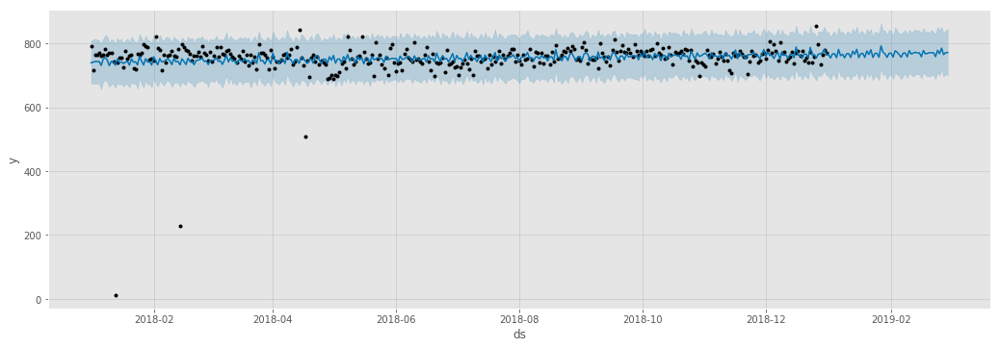

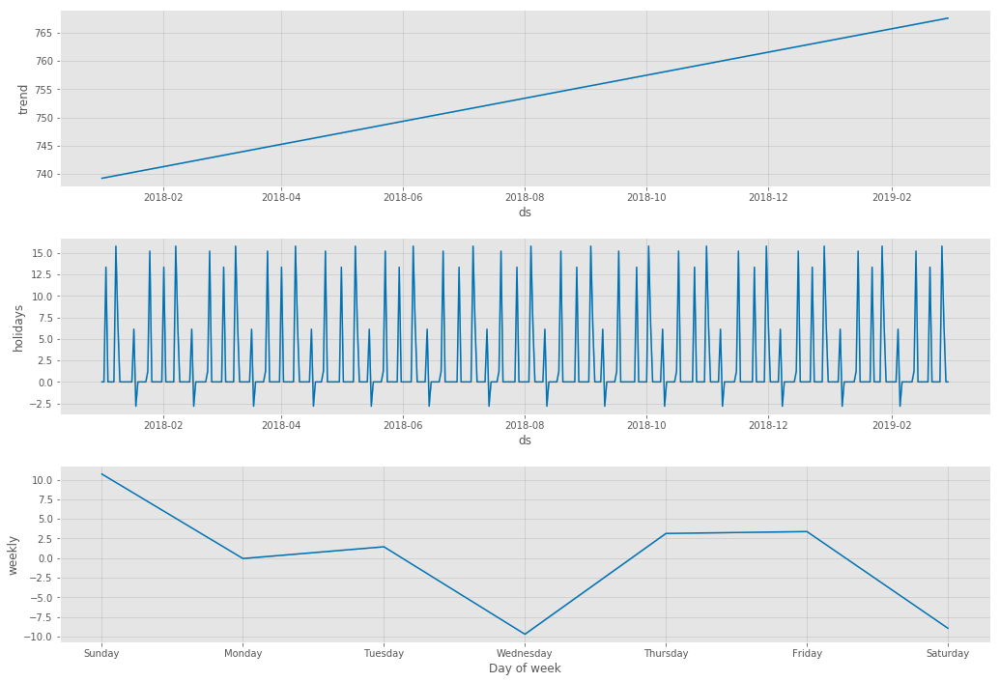

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


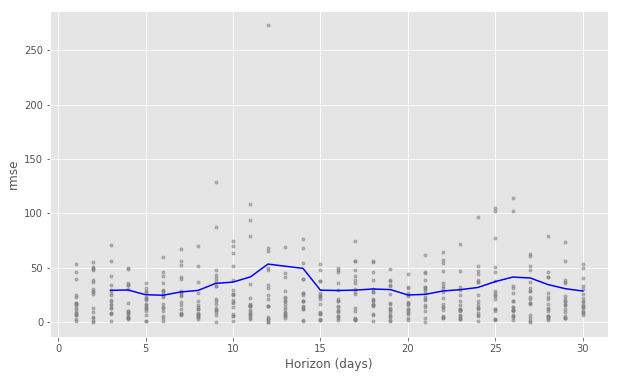

tweets_happysad_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


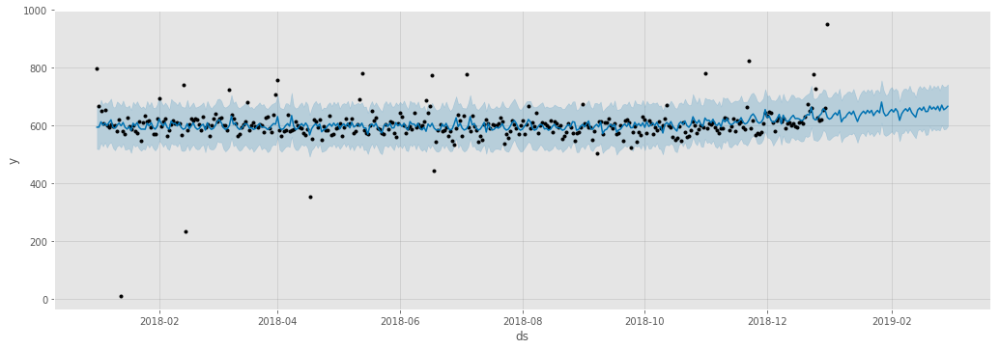

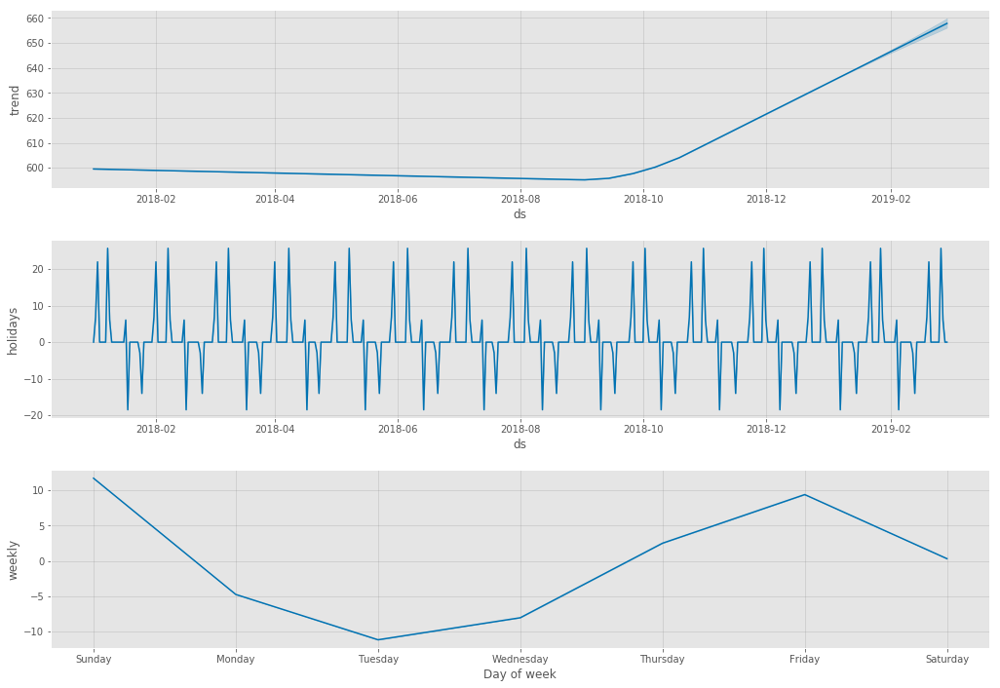

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


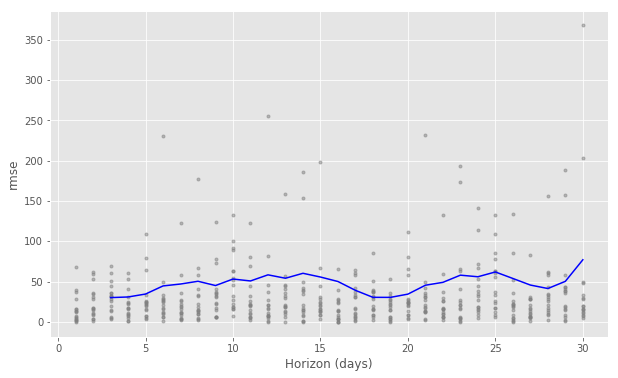

tweets_music_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


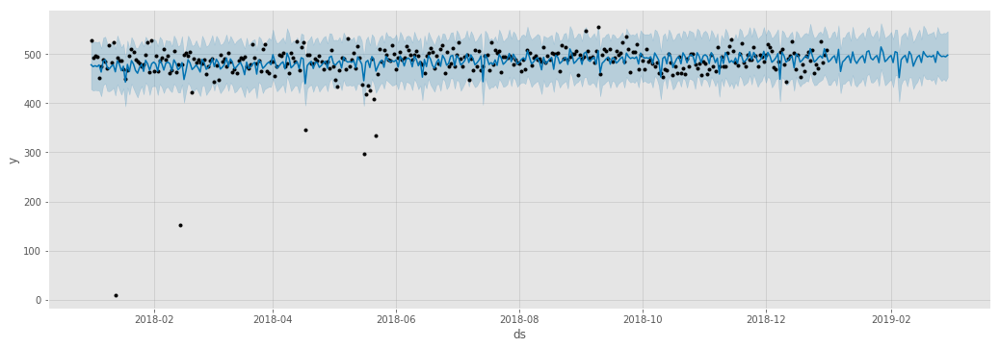

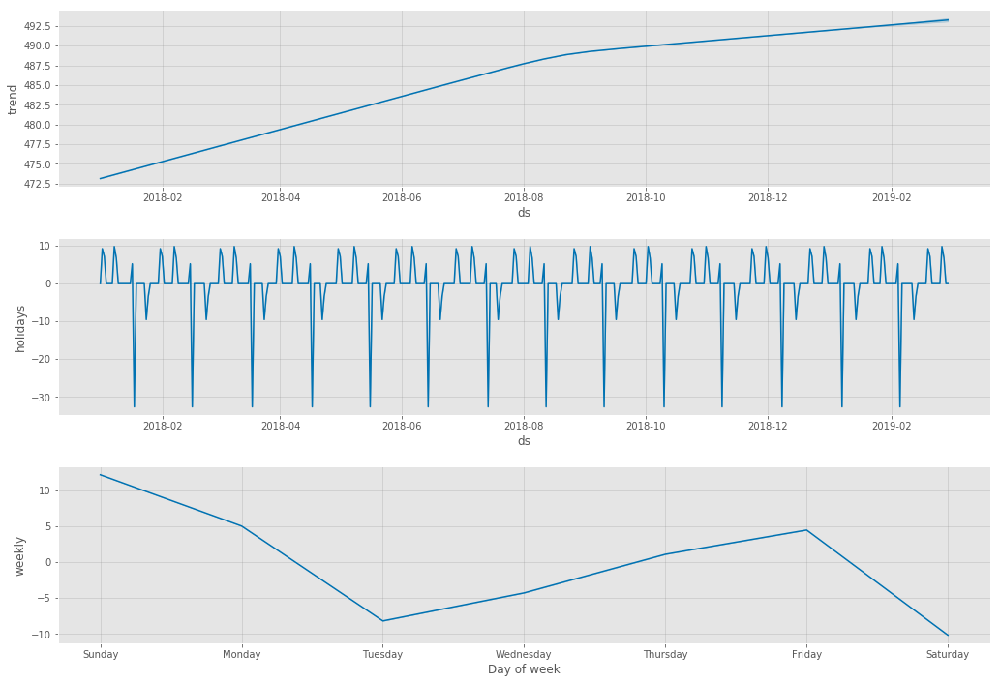

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


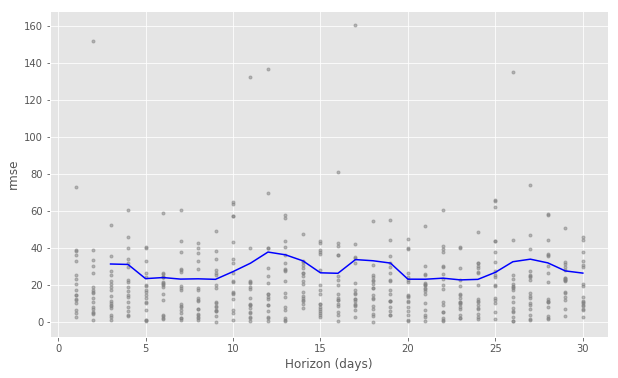

tweets_money_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


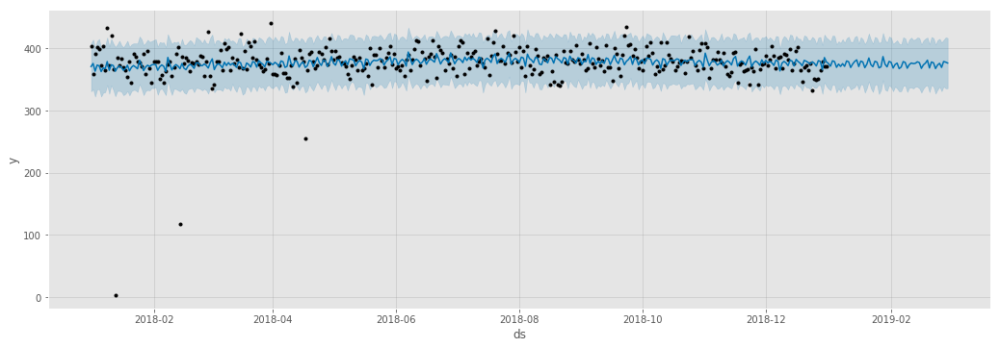

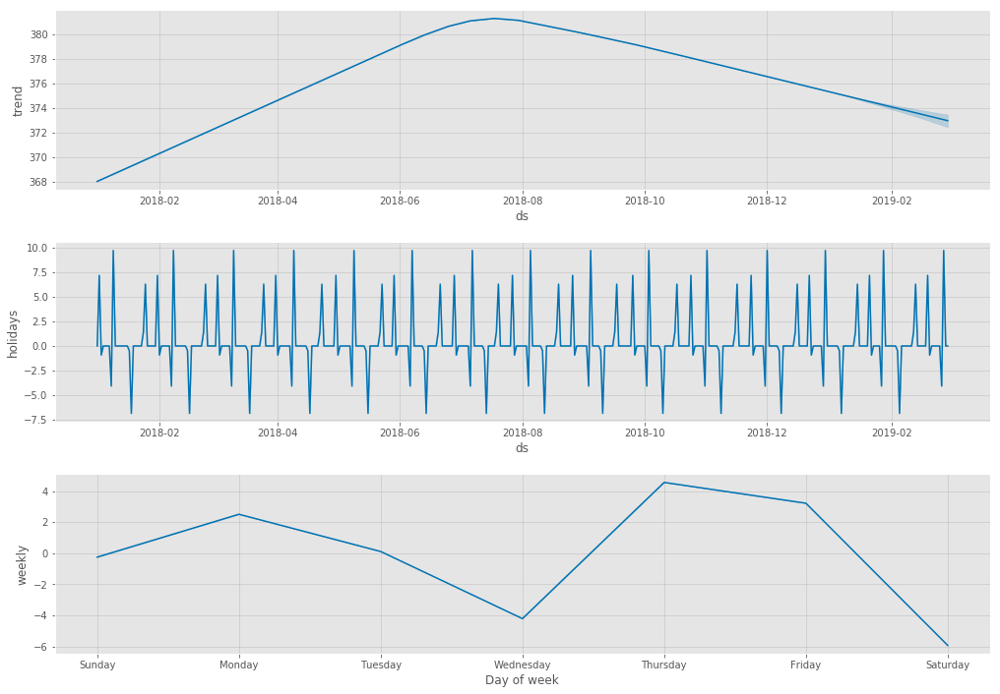

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


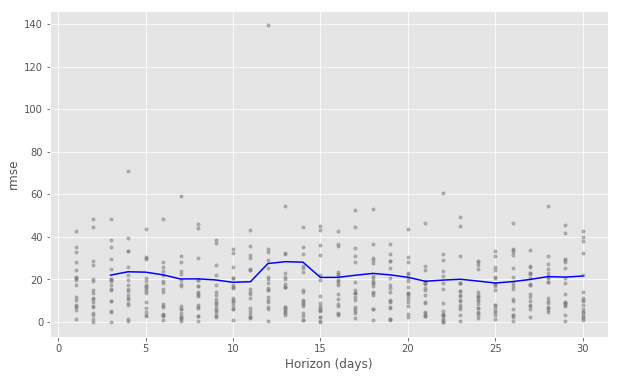

tweets_nowords_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


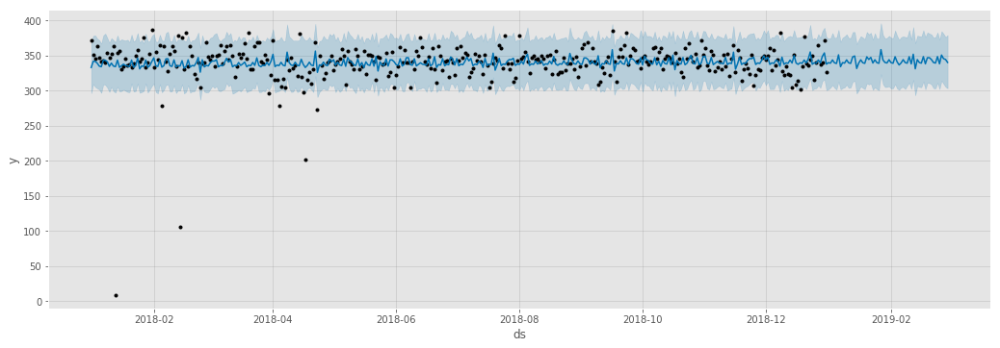

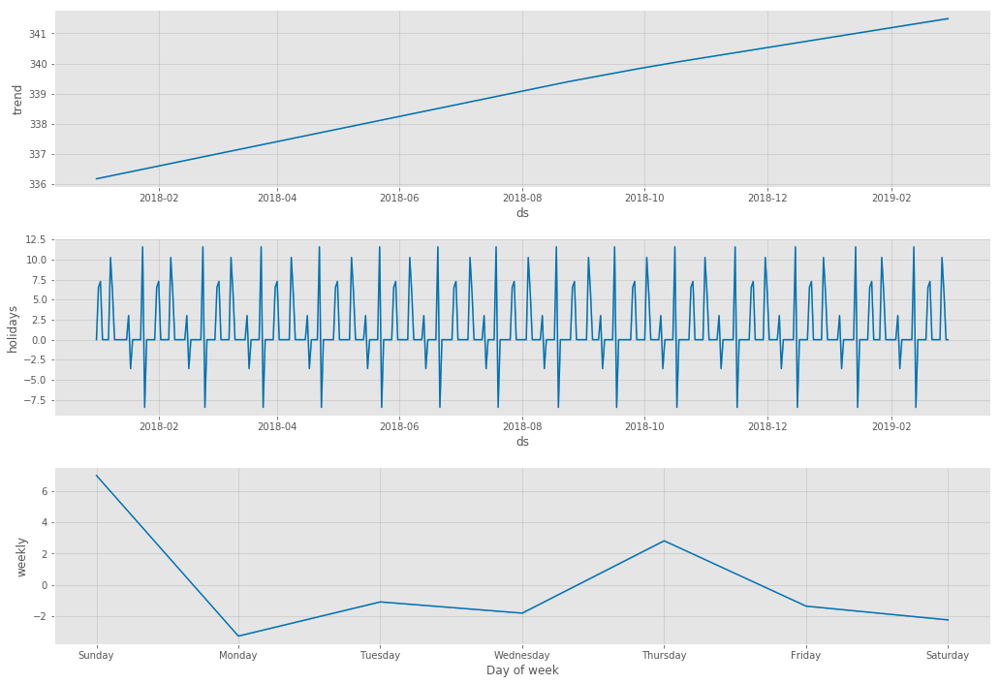

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


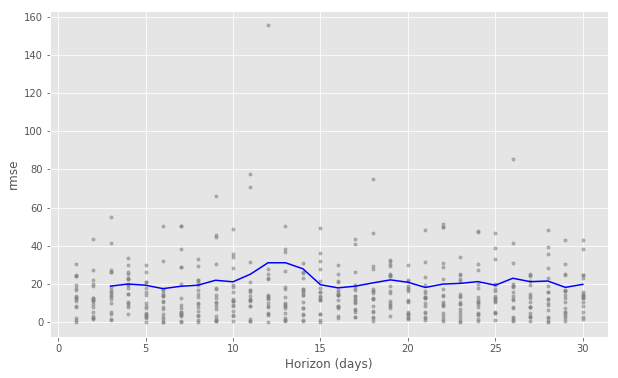

tweets_politics_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


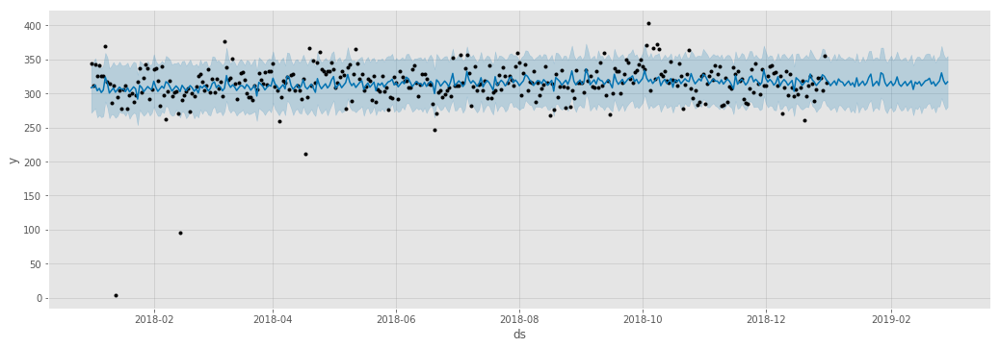

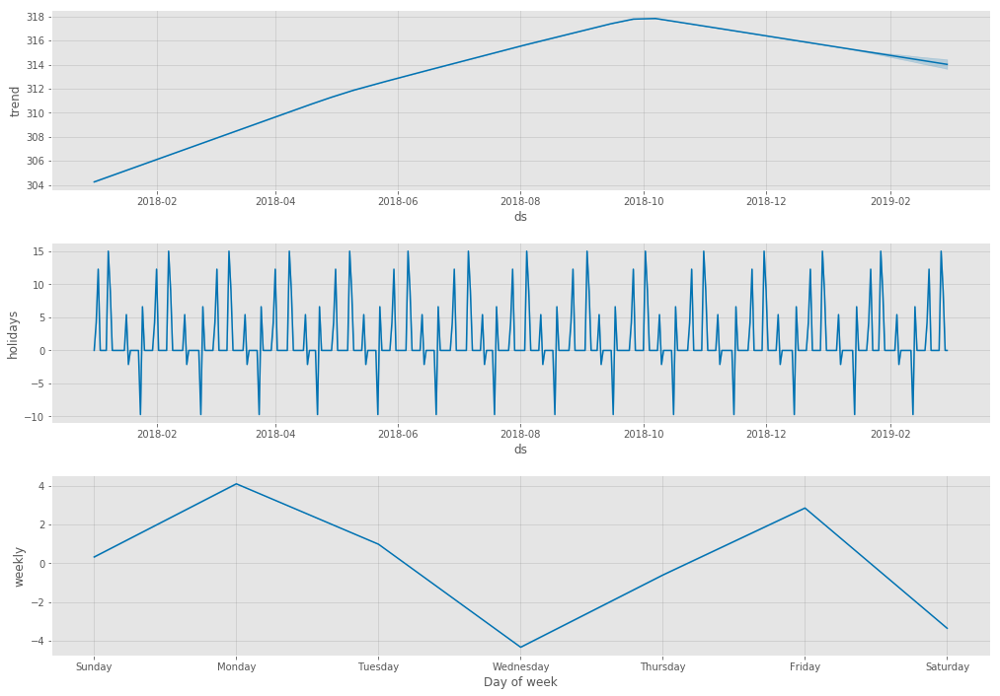

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


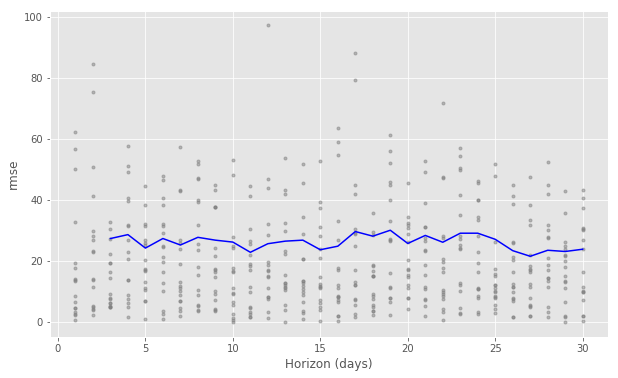

tweets_coding_2018.csv


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


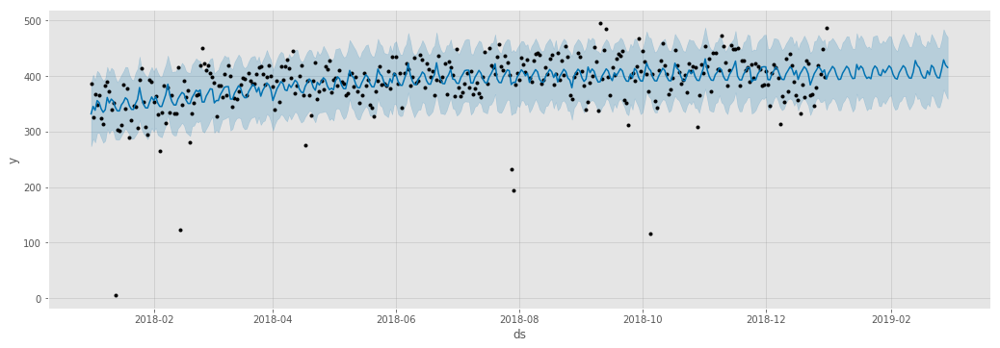

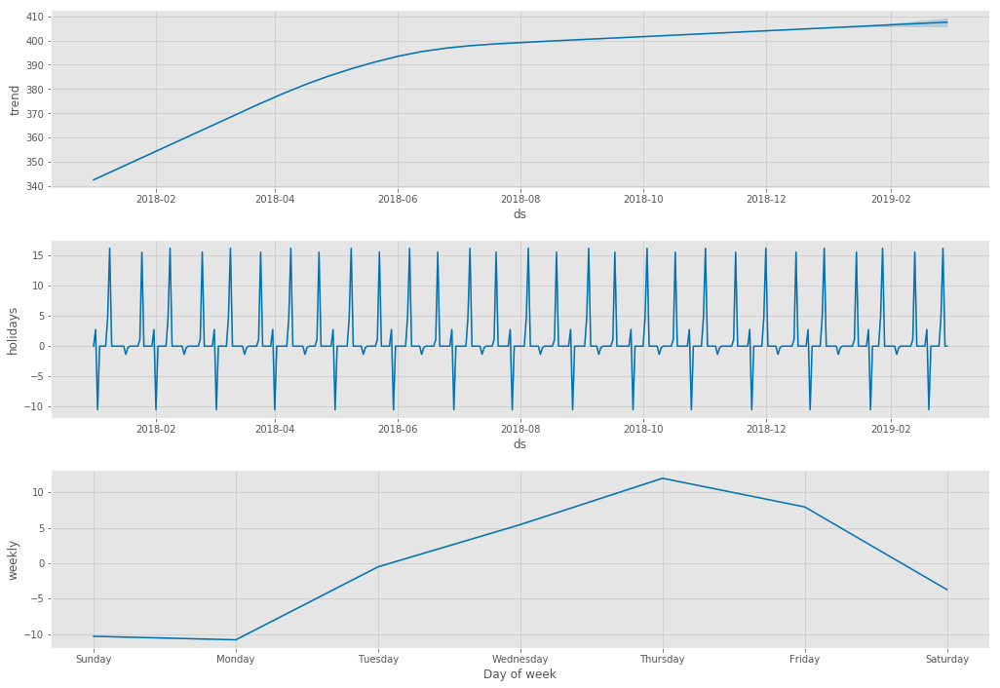

INFO:fbprophet:Making 17 forecasts with cutoffs between 2018-04-05 00:00:00 and 2018-12-01 00:00:00


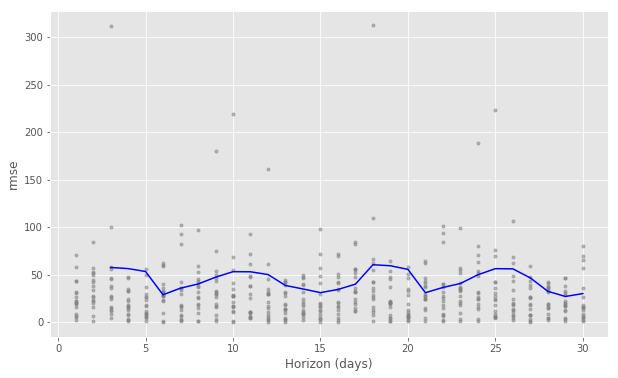

In [59]:
# Running each CSV file through FBPophet
for search in tweet_csv_files:
    tweet_fbprophet(search)

## Word Cloud test

It turns outthat with a corpus of the size I have, making a word cloud with this library is a 12-hour proposition for each run. Nevertheless, below is the code to do so should you have the desire.

In [63]:
filename = 'tweets_lovehate_2018.csv'

In [64]:
# reads in the CSV file as a DataFrame
df = pd.read_csv(filename)
df.timestamp = pd.to_datetime(df.timestamp, format='%Y%m%d')  
comment_words = ' '

In [65]:
# define our list of stop words
stopwords = set(ENGLISH_STOP_WORDS)
# now add extra things to that list that we want to filter out
stopwords.update(['twitter','com','pic','ve','ll','just',
                  'like','don','really','00'])

#### WARNING!!!

For over 365,000 lines of text, the code block below can take ***12+ hours*** to execute!!!

In [1]:
##### comment out the next line if you wish to run the rest of the code below #####
break

# # iterate through the csv file 
# it=0
# for val in df.text: 
#     val = str(val)          # typecaste each val to string 
#     tokens = val.split()    # split the value 
    
#     # Convert each token into lowercase 
#     for i in range(len(tokens)): 
#         tokens[i] = tokens[i].lower() 
    
#     for words in tokens: 
#         comment_words = comment_words + words + ' '
#     it+=1
#     print(f"Completed {it} loops")

SyntaxError: 'break' outside loop (<ipython-input-1-5b5d8b7fe64f>, line 2)

In [105]:
wordcloud = WordCloud(width = 1200, height = 1200, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)

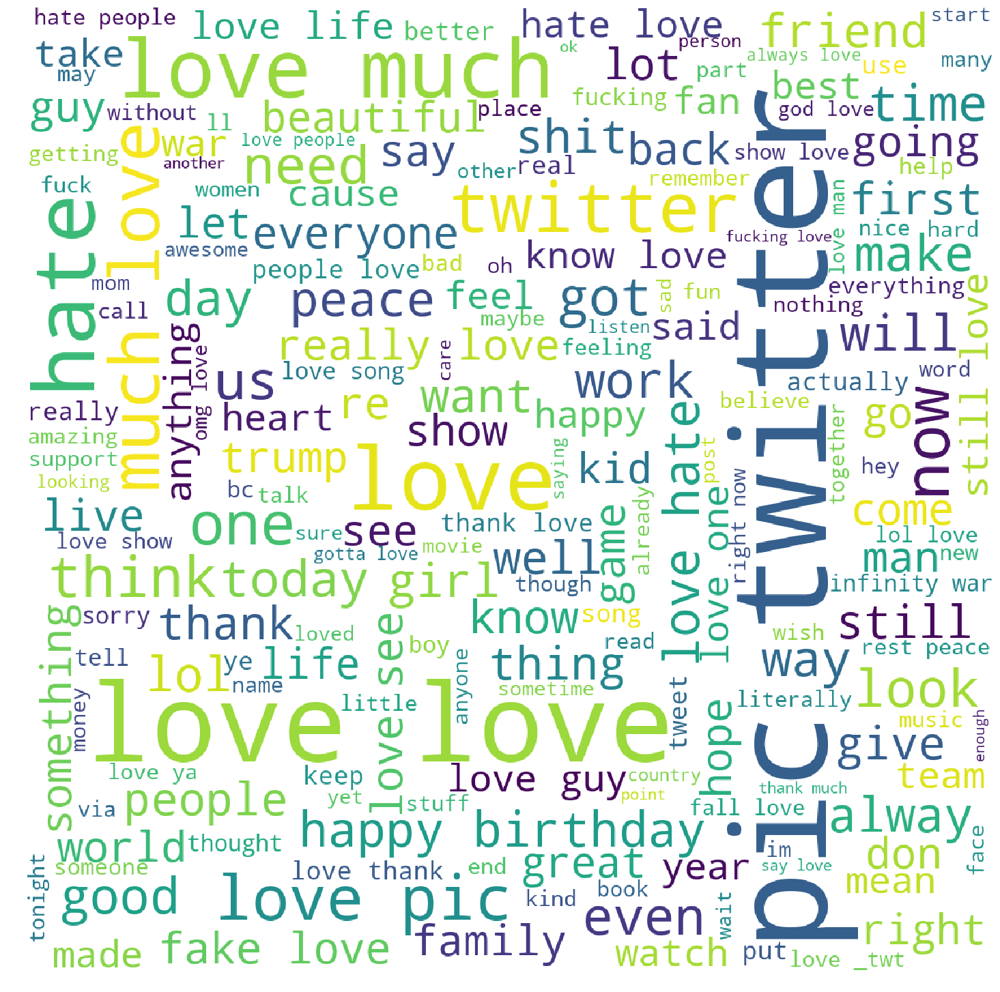

In [106]:
# plot & save the WordCloud image                        
plt.figure(figsize = (20, 20), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.savefig('images/wordcloud_lovehate.png')

**OK, that took entirely too long to process.** Perhaps there are less resource-expensive ways to examine the data we have gathered.

## Looking at sentiment polarities & word frequencies 

In [60]:
# getting lists of dates for each lunar phase
all_phases = list(phases_2018_df.date.astype(str))
fullmoon_2018 = list(phases_2018_df[phases_2018_df.phase == 'Full Moon'].date.astype(str))
lastquarter_2018 = list(phases_2018_df[phases_2018_df.phase == 'Last Quarter'].date.astype(str))
newmoon_2018 = list(phases_2018_df[phases_2018_df.phase == 'New Moon'].date.astype(str))
firstquarter_2018 = list(phases_2018_df[phases_2018_df.phase == 'First Quarter'].date.astype(str))

In [66]:
df1 = df.set_index('timestamp')

# filtering only for tweets on Full Moon nights
tweets_full = df1.loc[df1.index.floor('D').isin(fullmoon_2018)]
tweets_last = df1.loc[df1.index.floor('D').isin(lastquarter_2018)]
tweets_new = df1.loc[df1.index.floor('D').isin(newmoon_2018)]
tweets_first = df1.loc[df1.index.floor('D').isin(firstquarter_2018)]
tweets_not_in_phase = df1.loc[~df1.index.floor('D').isin(all_phases)]

In [67]:
tweets_not_in_phase.head()

,text,sentiment,polarity,subjectivity,tally
timestamp,,,,,
2018-01-01,i hate everyone.... naaa.. i just hate people...,negative,-0.800000,0.900000,1
2018-01-01,I love how your new label is taking everything...,positive,0.387273,0.550909,1
2018-01-01,I'll love you 'till my breathing stops...,positive,0.500000,0.600000,1
2018-01-01,"If RDR2 has loot boxes, I hope that 1/10 of th...",positive,0.150000,0.700000,1
2018-01-01,Love love luv you more,positive,0.500000,0.566667,1


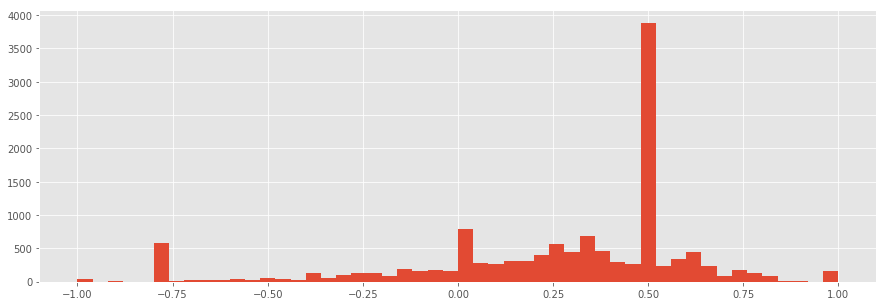

In [68]:
plt.figure(figsize=(15,5))
plt.hist(tweets_full.polarity, bins=50);

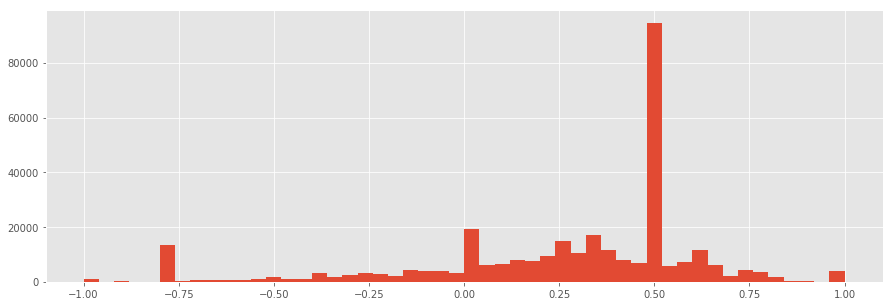

In [69]:
plt.figure(figsize=(15,5))
plt.hist(tweets_not_in_phase.polarity, bins=50);

### Well that was a bit disappointing. 

No easily discernible differences in sentiment polarity between full moons and non-phase dates. But null results are still informative, so it wasn't a total waste of time.

In [70]:
# function to get most frequent words
def get_top_n_words(corpus, stopwords):
    vec = CountVectorizer(stop_words=stopwords).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq


# function for plotting the most frequent words
def plot_phase_words(corpus, keywords, phase, stopwords, n=None):
    comm_words = get_top_n_words(corpus.text, stopwords)[:n]
    df2 = pd.DataFrame(comm_words, columns=['text', 'count'])
    total = df2['count'].sum()    
    # plotting
    fig, ax = plt.subplots(figsize=(15,5))
    plt.xticks(rotation=30, fontsize=14)
    hghts = ((df2['count'] / total) * 100)
    rects = ax.bar(df2.text, hghts)
    ax.set_title(f"Top {n} Words for {phase} at Midnight UTC", fontsize=16)
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width(), 1.005*height,
                f'{np.round(height, 2)}%', ha='right', va='bottom')
    plt.plot([], [], ' ', label=f"Search Keywords:\n{keywords}")
    plt.legend(fontsize=14)
    plt.show();


# function to parse a CSV file and then plot all results
def plot_CSV_words(filename, keywords, phases_df, n=None):
    """
    Inputs:
    filename       (str) CSV filename generated from Twitter scraping function
    keywords       (str) the query keywords used in Twitter scraping function
    phases_df      (df) dataframe of lunar phases for a given year
    n              (int) number of most common words to return
    ==================================================
    Returns:
    Histograms (5 total) of the 'n' most common words for each lunar phase and for
    all the nights not in a lunar phase.
    """
    df = pd.read_csv(filename)
    df.dropna(inplace=True)
    df.timestamp = pd.to_datetime(df.timestamp, format='%Y%m%d')  
    stopwords = set(ENGLISH_STOP_WORDS)
    # now add extra things to that list that we want to filter out
    stopwords.update(['twitter','com','pic','ve','ll','just','like','don','really','00'])
    df.set_index('timestamp', inplace=True)
    
    phase_list = ['Full Moon','Last Quarter','New Moon','First Quarter','No Phase']
    for phase in phase_list:
        all_moons = list(phases_df.date.astype(str))
        if phase != 'No Phase':
            moon = list(phases_df[phases_df.phase == phase].date.astype(str))
            moon_data = df.loc[df.index.floor('D').isin(moon)]
            plot_phase_words(moon_data, keywords, phase, stopwords, n=n)
        else:
            moon_data = df.loc[~df.index.floor('D').isin(all_moons)]
            plot_phase_words(moon_data, keywords, phase, stopwords, n=n)

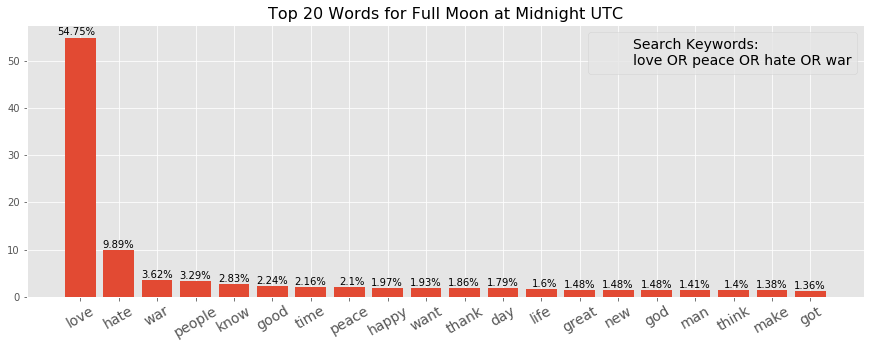

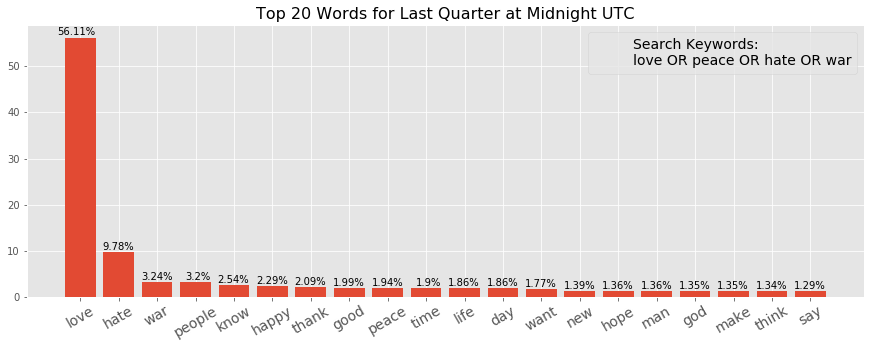

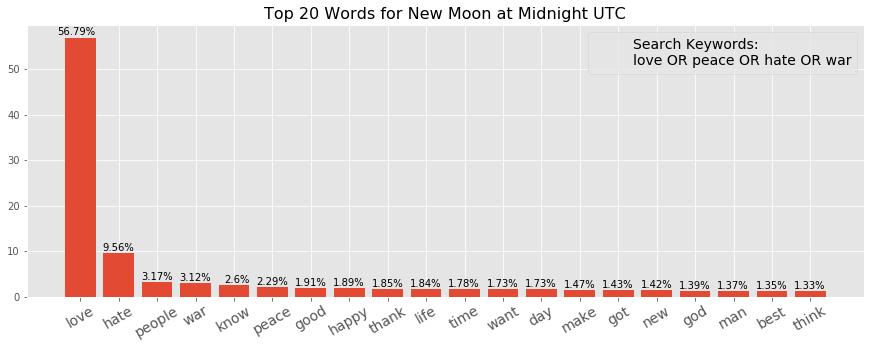

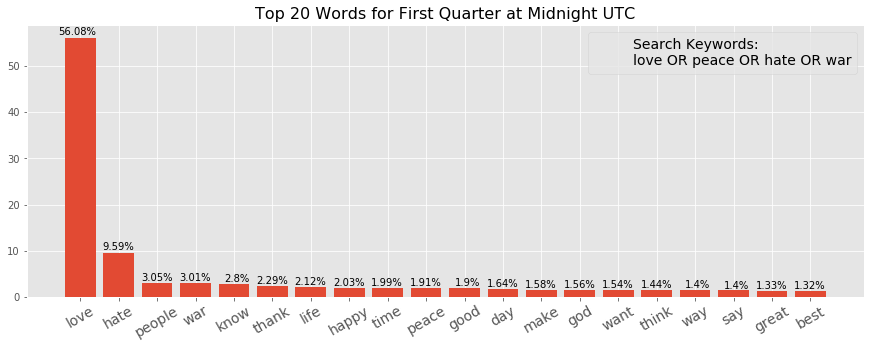

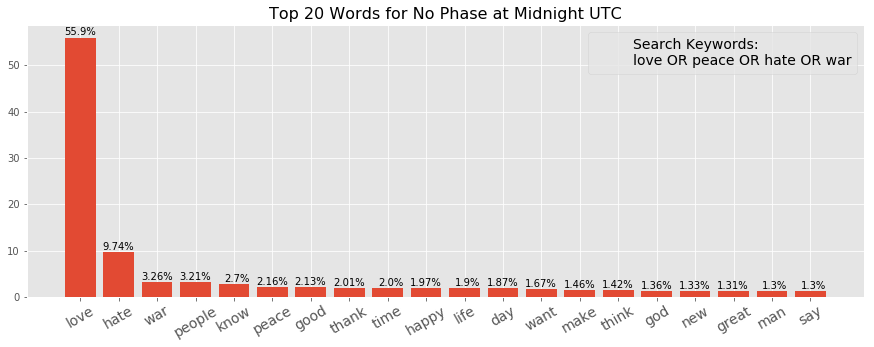

...

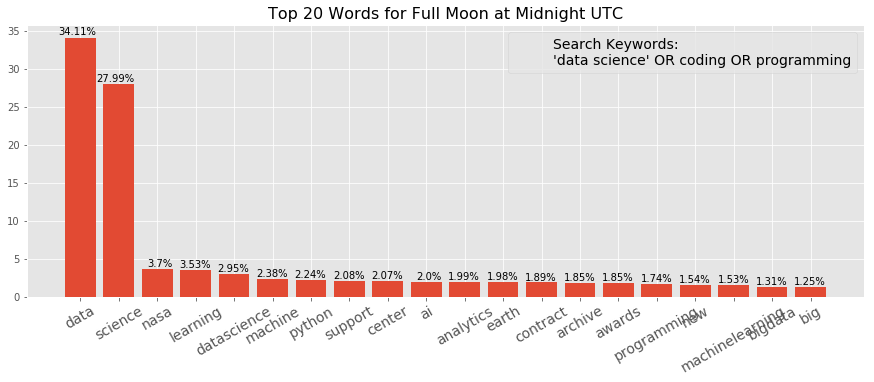

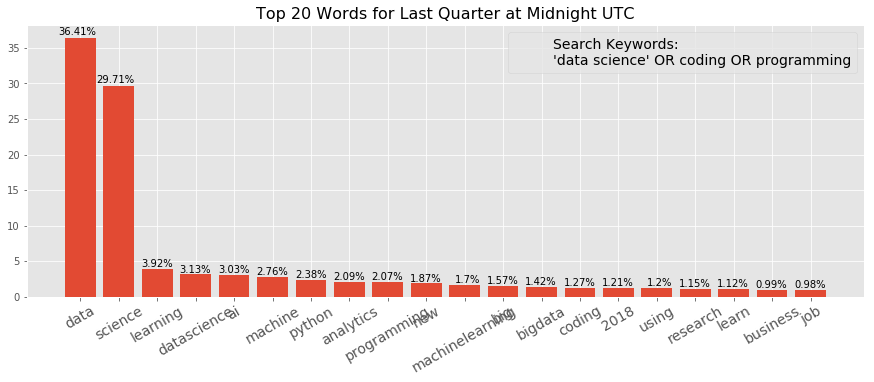

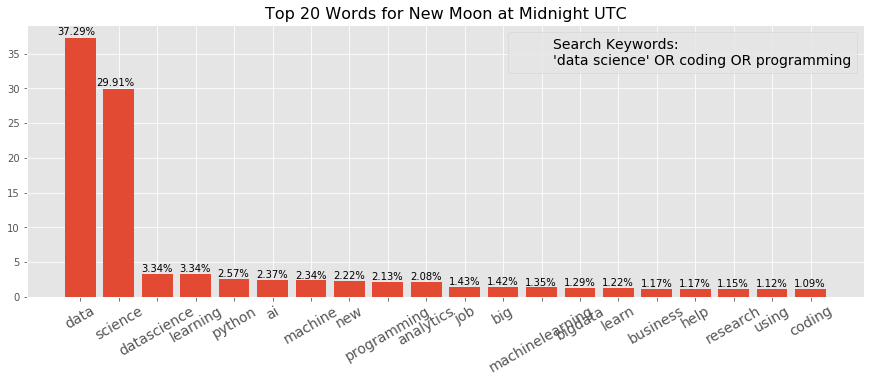

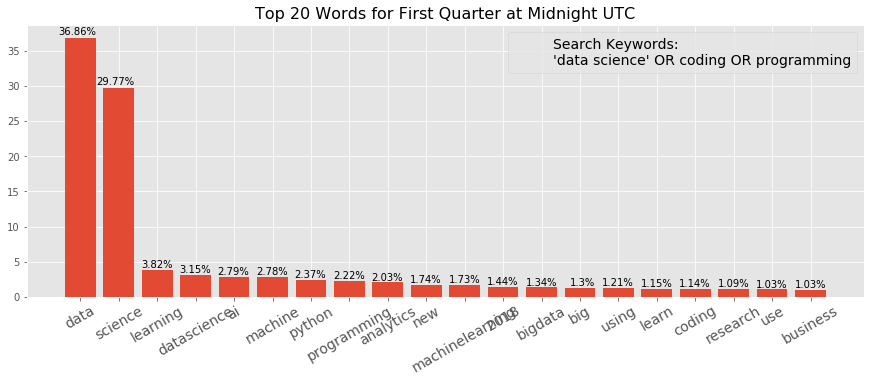

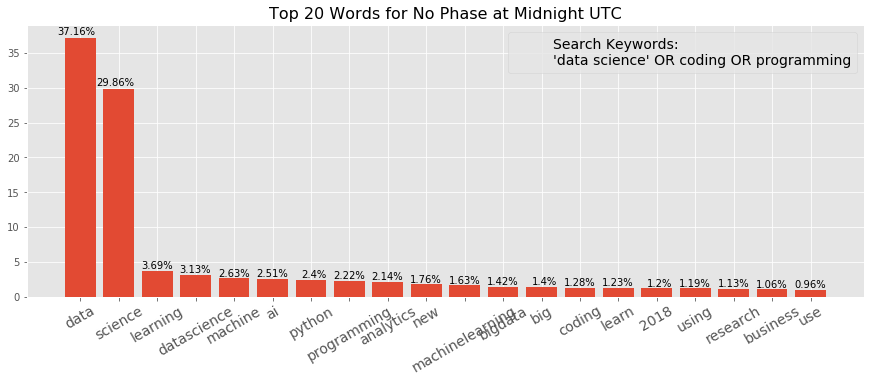

In [71]:
tweet_csv_files = ['tweets_lovehate_2018.csv',
                   'tweets_happysad_2018.csv',
                   'tweets_music_2018.csv',
                   'tweets_money_2018.csv',
                   'tweets_nowords_2018.csv',
                   'tweets_politics_2018.csv',
                   'tweets_coding_2018.csv']

queries = ['love OR peace OR hate OR war',
           'happy OR sad OR life OR death',
           'music OR tunes OR dance',
           'stocks OR money OR taxes',
           '(no keywords entered)',
           'politics OR government OR Trump',
           "'data science' OR coding OR programming"] 

for filename, key_words in zip(tweet_csv_files, queries):
    plot_CSV_words(filename=filename,
               keywords=key_words,
               phases_df=phases_2018_df,
               n=20)

### For fancy Tweet graphs, see my Scattertext notebook:

Here's a [link](Scattertext.ipynb) to my Scattertext notebook.

Here's a [simplified example](Scattertext_nowords_example.html) of the output that should load within 1-2 minutes.

Example output:
![title](images/scattertext_lovehate.gif)

# Recommendations & Final Thoughts

**Lessons**
   * Human behavior appears to have a small correlation to lunar cycles
   * Full Moon & Last Quarter Moon exhibit increased positivity
   * New Moon & First Quarter Moon exhibit increased negativity
   * Financial markets are not immune to lunar correlation, though +/- depends on stock/currency 
   * Financial markets also exhibit tendency to immediately correct the day after a lunar phase

**Recommendations & Future Research**
   * Run models on multiple years of data, and larger volume of tweets throughout the day
   * Investors ought to take lunar cycles into consideration when building their forecasts & algorithms
   * The Scattertext library stands to be very useful in many fields of research and government